# Import librairies

In [1]:
# To check PEP8 need installation : pip install flake8 pycodestyle pycodestyle_magic
# add %%flake8 in each block to check it
%load_ext pycodestyle_magic

In [2]:
# %%flake8

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, RobustScaler, LabelEncoder

from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import adjusted_rand_score, accuracy_score

from PIL import Image, ImageOps
import cv2

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.applications import VGG16, ResNet50, vgg16, resnet50

 # Load data files

In [3]:
# %%flake8

datas = pd.read_csv('Flipkart/flipkart_com-ecommerce_sample_1050.csv')

# Overview of data

In [4]:
# %%flake8

# To optimize display of the Dataframe

# increase max rows displayed to 999
pd.set_option('display.max_rows', 999)

# increase max columns displayed to 999
pd.set_option('display.max_columns', None)
# increase columns width to 200
pd.set_option('display.max_colwidth', None)

# Formating float
pd.options.display.float_format = '{:.2f}'.format

In [5]:
# %%flake8

# define random_state
rd_state = 13

In [6]:
datas.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}"
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.00,449.00,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""Ideal Fo

In [7]:
datas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [8]:
# %%flake8

# fix type date
datas['crawl_timestamp'] = pd.to_datetime(
    datas['crawl_timestamp'])

In [9]:
datas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   uniq_id                  1050 non-null   object             
 1   crawl_timestamp          1050 non-null   datetime64[ns, UTC]
 2   product_url              1050 non-null   object             
 3   product_name             1050 non-null   object             
 4   product_category_tree    1050 non-null   object             
 5   pid                      1050 non-null   object             
 6   retail_price             1049 non-null   float64            
 7   discounted_price         1049 non-null   float64            
 8   image                    1050 non-null   object             
 9   is_FK_Advantage_product  1050 non-null   bool               
 10  description              1050 non-null   object             
 11  product_rating           1050 

In [10]:
# %%flake8

datas.describe(include='all', datetime_is_numeric=True)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1049.00,1049.00,1050,1050,1050,1050,1050,712,1049
unique,1050,NaN,1050,1050,642,1050,NaN,NaN,1050,2,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,NaN,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars""]",CRNEG7BKMFFYHQ8Z,NaN,NaN,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Mug""}, {""key""=>""Mug Capacity"", ""value""=>""5.5 l""}, {""key""=>""Freezer Safe"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Ceramic""}, {""key""=>""Microwave Safe"", ""value""=>""Yes""}, {""value""=>""1 Year Rockmantra Brand Warranty and Free Transit Insurance.""}, {""key""=>""Diameter"", ""value""=>""88 mm""}, {""key""=>""Weight"", ""value""=>""300 g""}, {""key""=>""Height"", ""value""=>""101 mm""}, {""key""=>""Width"", ""value""=>""88 mm""}, {""key""=>""Sales Package"", ""value""=>""1 mug""}]}"
freq,1,NaN,1,1,56,1,NaN,NaN,1,993,1,889,889,11,22
mean,NaN,2016-01-22 20:35:46.106666752+00:00,NaN,NaN,NaN,NaN,2186.20,1584.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,2015-12-01 06:13:00+00:00,NaN,NaN,NaN,NaN,35.00,35.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,2015-12-01 12:40:44+00:00,NaN,NaN,NaN,NaN,555.00,340.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,2016-01-01 10:55:30+00:00,NaN,NaN,NaN,NaN,999.00,600.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,2016-03-03 10:08:31.500000+00:00,NaN,NaN,NaN,NaN,1999.00,1199.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,2016-06-26 14:21:24+00:00,NaN,NaN,NaN,NaN,201000.00,201000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# %%flake8

#check duplicate uniq_id
datas[datas.duplicated(subset=['uniq_id'])]

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications


# Text analyzis

## Cleaning and normalization of text data

### Extraction categories of products

In [12]:
# %%flake8

def extract_category(column, level):
    if str(column).count(' >> ') >= level-1:
        category = str(column).split(' >> ')[level-1]
    else:
        category = np.nan
    return category

In [13]:
# %%flake8

# use function extract_category to extract first category of product
datas['product_1st_category'] = datas['product_category_tree'].apply(
    lambda x: eval(x)).apply(pd.Series)[0].apply(extract_category, level=1)
print('First category: number of category : ',
      datas['product_1st_category'].nunique())

First category: number of category :  7


In [14]:
# %%flake8

# use function extract_category to extract second category of product
datas['product_2nd_category'] = datas['product_category_tree'].apply(
    lambda x: eval(x)).apply(pd.Series)[0].apply(extract_category, level=2)
print('Second category: number of category : ',
      datas['product_2nd_category'].nunique())

Second category: number of category :  62


In [15]:
# %%flake8

# use function extract_category to extract third category of product
datas['product_3rd_category'] = datas['product_category_tree'].apply(
    lambda x: eval(x)).apply(pd.Series)[0].apply(extract_category, level=3)
print('Thrid category: number of category : ',
      datas['product_3rd_category'].nunique())

Thrid category: number of category :  241


In [16]:
datas

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,product_1st_category,product_2nd_category,product_3rd_category
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56+00:00,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56+00:00,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.00,449.00,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", 

In [17]:
# %%flake8

def bar_df_column(df, column, xlabel, ylabel, title, order=True, rotation=0):
    """ create a function to display a bar plot of a column from a dataframe """
    
    plt.figure(figsize=(15, 7))
    if order:
        sns.countplot(x=column, data=df,
                      order=df[column].value_counts().iloc[:].index)
    else:
        sns.countplot(x=column, data=df)
    plt.xticks(rotation=rotation)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

    # to save graph
    plt.savefig(title + '.png', bbox_inches='tight')

    plt.show()


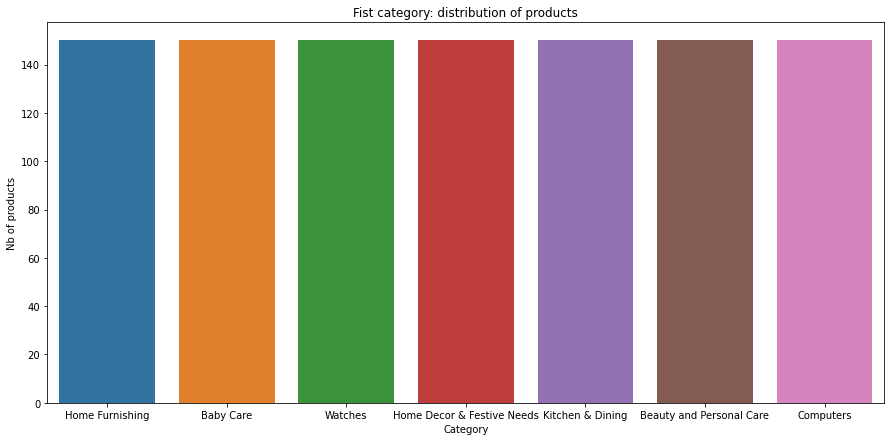

In [18]:
# %%flake8

# Graph about 1st category of product (use function bar_df_column)
bar_df_column(datas, 'product_1st_category', 'Category',
              'Nb of products', 'Fist category: distribution of products')

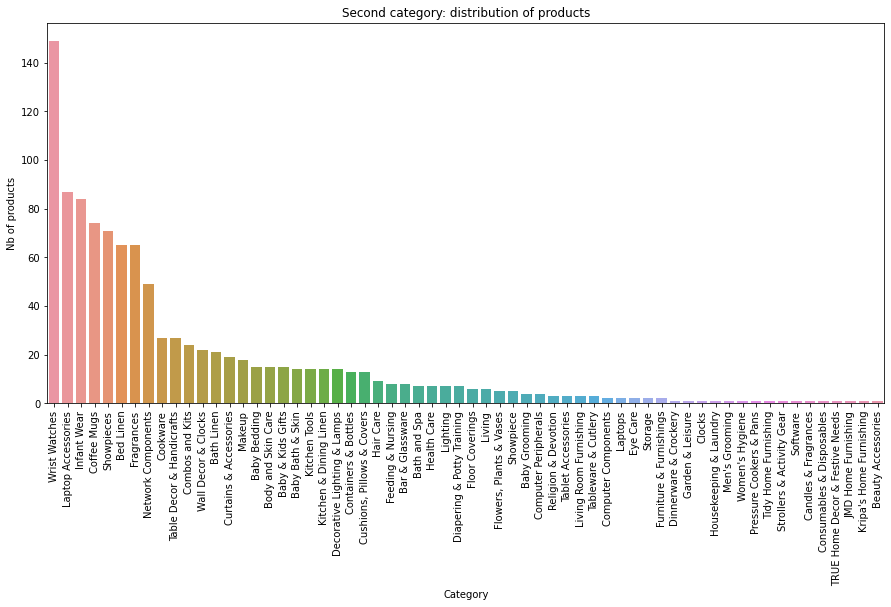

In [19]:
# %%flake8

# Graph about the second category of product (use function bar_df_column)
bar_df_column(datas, 'product_2nd_category', 'Category',
              'Nb of products',
              'Second category: distribution of products', rotation=90)

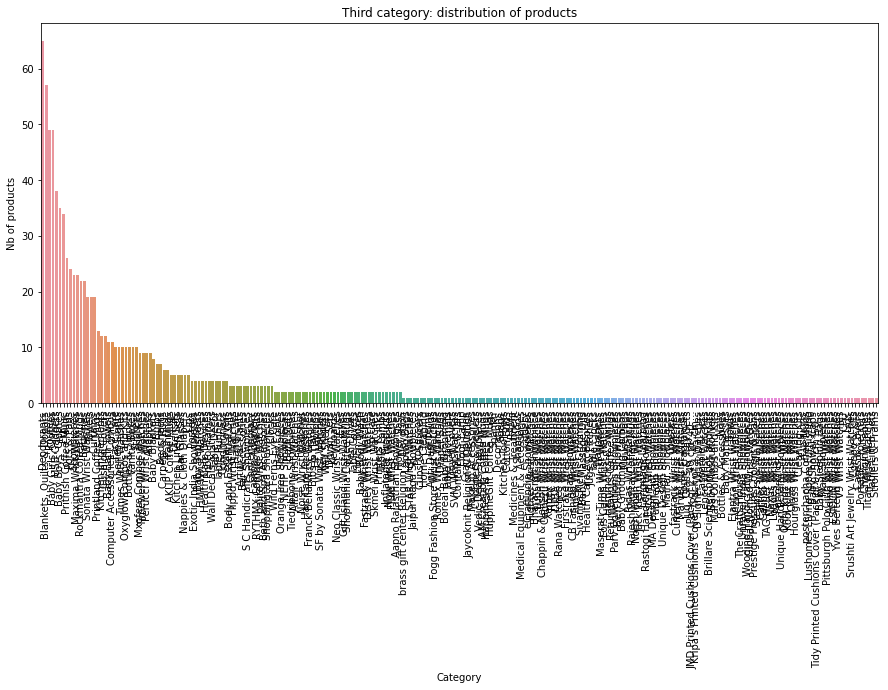

In [20]:
# %%flake8

# Graph about the third category of product (use function bar_df_column)
bar_df_column(datas, 'product_3rd_category', 'Category',
              'Nb of products',
              'Third category: distribution of products', rotation=90)

In [21]:
# %%flake8

def pie_df_column(datas, title, rotatelabels=0, autopct='%1.1f%%'):
    """ create a function to display a pie of a column from a dataframe """

    # if there's more than 10 labels hide it
    if datas.dropna().nunique() > 10:
        labels = None
    else:
        labels = datas.dropna().unique()
    plt.figure(figsize=(7, 7))
    plt.pie(datas.value_counts(), labels=labels,
            autopct=autopct, startangle=90, rotatelabels=rotatelabels)
    plt.title(title)

    # to save graph
    plt.savefig(title + '.png', bbox_inches='tight')

    plt.show()

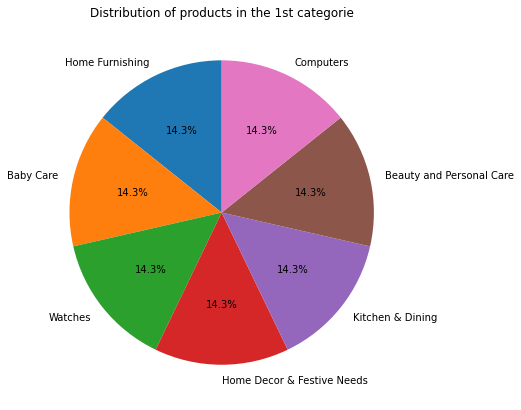

In [22]:
# %%flake8

# pie about the first category of product (use function pie_df_column)
pie_df_column(
    datas['product_1st_category'],
    'Distribution of products in the 1st categorie')

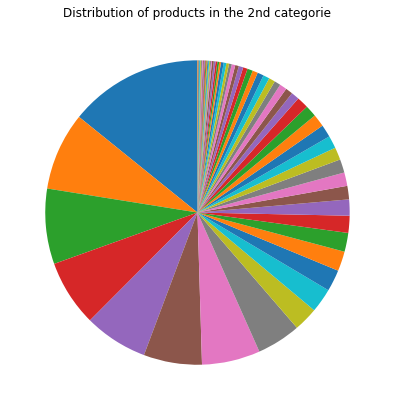

In [23]:
# %%flake8

# pie about the second category of product (use function pie_df_column)
pie_df_column(
    datas['product_2nd_category'],
    'Distribution of products in the 2nd categorie',
    autopct=None)

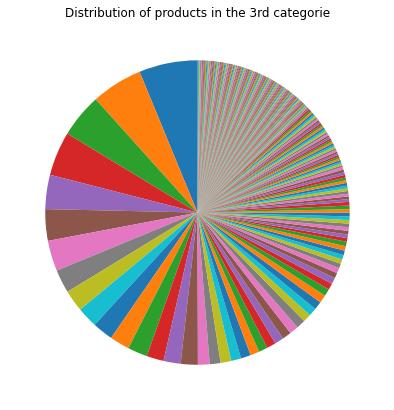

In [24]:
# %%flake8

# pie about the third category of product (use function pie_df_column)
pie_df_column(
    datas['product_3rd_category'],
    'Distribution of products in the 3rd categorie',
    autopct=None)

### Normalization of the description

In [25]:
# %%flake8

def boxplot_df_column(datas, xlabel, title):
    """ create a function to display a boxplot of a column from a dataframe """
    
    plt.figure(figsize=(12, 1))
    meanprops = {'marker': 'o', 'markeredgecolor': 'black',
                 'markerfacecolor': 'firebrick'}
    sns.boxplot(x=datas,
                showmeans=True, meanprops=meanprops)
    plt.title(title)
    plt.xlabel(xlabel)

    # to save graph
    plt.savefig(title + '.png', bbox_inches='tight')

    plt.show()

    print("median: ", datas.median())
    print("mean: ", datas.mean())

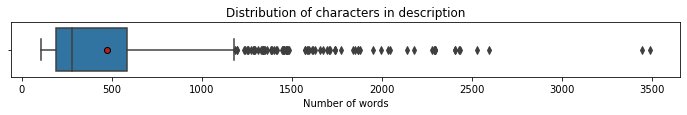

median:  278.0
mean:  473.8209523809524


In [26]:
# %%flake8

# use function boxplot_df_column to display the distribution of the words
boxplot_df_column(datas['description'].str.len(), 'Number of words',
                  'Distribution of characters in description')

#### Remove numeric and punctuation

In [27]:
# %%flake8

# tokenize column description just keep characters

tokenizer = nltk.RegexpTokenizer(r'[A-Za-z]+')
datas['description_split'] = datas['description'].apply(
        lambda x: tokenizer.tokenize(x))
datas

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,product_1st_category,product_2nd_category,product_3rd_category,description_split
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56+00:00,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}",Home Furnishing,Curtains & Accessories,Curtains,"[Key, Features, of, Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, Floral, Curtain, Elegance, Polyester, Multicolor, Abstract, Eyelet, Door, Curtain, cm, in, Height, Pack, of, Price, Rs, This, curtain, enhances, the, look, of, the, interiors, This, curtain, is, made, from, high, quality, polyester, fabric, It, features, an, eyelet, style, stitch, with, Metal, Ring, It, makes, the, room, environment, romantic, and, loving, This, curtain, is, ant, wrinkle, and, anti, shrinkage, and, have, elegant, apparance, Give, your, home, a, bright, and, modernistic, appeal, with, these, designs, The, surreal, attention, is, sure, to, steal, hearts, These, contemporary, eyelet, and, valance, curtains, slide, smoothly, so, ...]"
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56+00:00,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.00,449.00,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cot

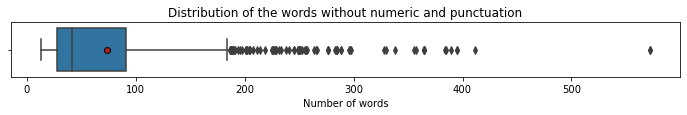

median:  41.0
mean:  73.20952380952382


In [28]:
# %%flake8

# use function boxplot_df_column to display the distribution of the words
boxplot_df_column(datas['description_split'].str.len(), 'Number of words',
                  'Distribution of the words without numeric and punctuation')

In [29]:
# %%flake8

def word_cloud(data, title, stopwords=''):
    """ create a function to display a word could """
    
    plt.figure(figsize=(15, 10))
    text = ' '.join(np.concatenate(data))
    wordcloud = WordCloud(background_color='white',
                          collocations=False, normalize_plurals=False,
                          stopwords=stopwords, random_state=rd_state).generate(text)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title + '\n')
    
    # to save graph
    plt.savefig(title + '.png', bbox_inches='tight')
    
    plt.show()
    print('Number of words : ', len(text.split()))

    # calculate the number of unique word
    word_count = pd.Series(
        [y for x in data for y in x]).value_counts().to_frame(
        "frequency").reset_index().rename(columns={'index': 'word'})
    nb_unique_word = len(word_count)
    print('Number of unique words : ', nb_unique_word)
    return (wordcloud.words_, word_count)

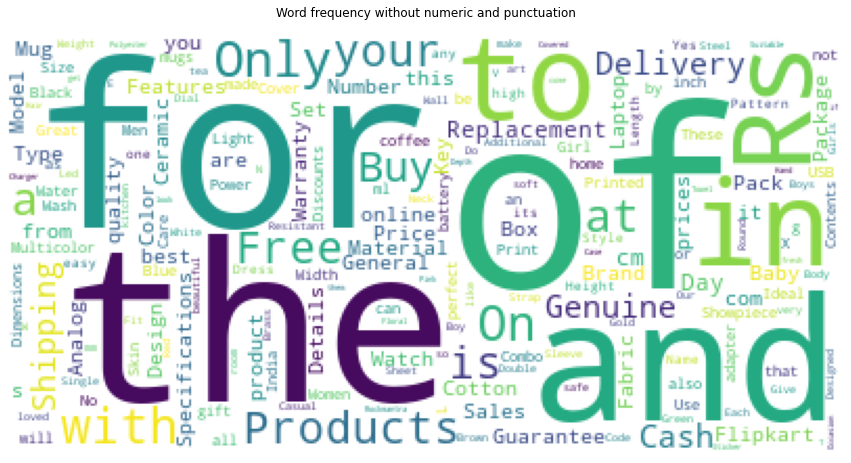

Number of words :  76870
Number of unique words :  6833


In [30]:
# %%flake8

# use function word_cloud on column description_split
word_frequence_without_num_punct, word_count_without_num_punct = word_cloud(
    datas['description_split'], title='Word frequency without numeric and punctuation')

#### Convert to lower case

In [31]:
# %%flake8

# convert the description_split in lower case
datas['description_split'] = datas[
    'description_split'].map(lambda x: list(map(str.lower, x)))

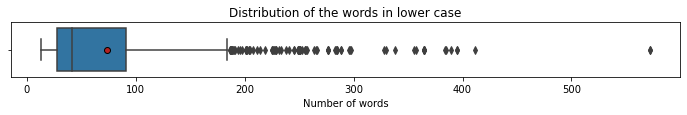

median:  41.0
mean:  73.20952380952382


In [32]:
# %%flake8

# use function boxplot_df_column to display the distribution of the words
boxplot_df_column(datas['description_split'].str.len(),
                  'Number of words', 'Distribution of the words in lower case')

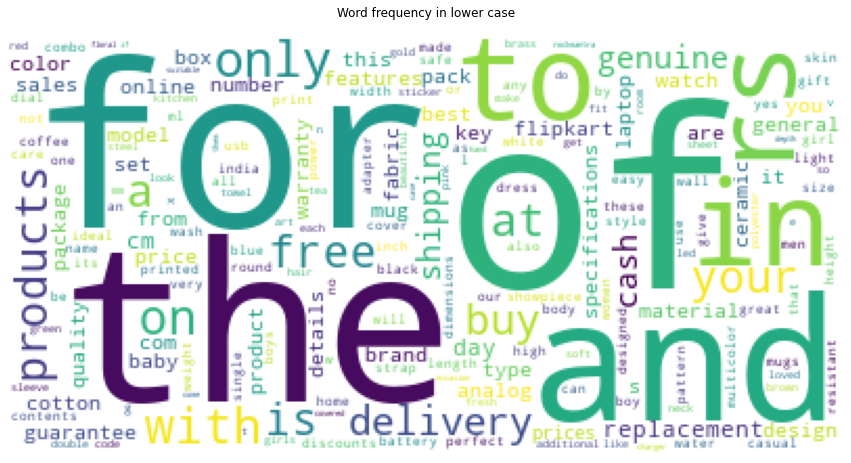

Number of words :  76870
Number of unique words :  5214


In [33]:
# %%flake8

# use function word_cloud on column description_split
word_frequence_lower_case, word_count_lower_case = word_cloud(
    datas['description_split'], title='Word frequency in lower case')

#### Remove the stopwords

In [34]:
# %%flake8

# add to stopwords the string with less or equal 2 characters
stop_words = word_count_lower_case[
    word_count_lower_case['word'].str.len() <= 2]['word'].tolist()

In [35]:
# %%flake8

# use stopwords from nltk
stop = nltk.corpus.stopwords.words('english')
stop_words.extend(stop)

# remove stopwords in column description_split
datas['description_split'] = datas['description_split'].apply(
    lambda x: [item for item in x if item not in stop_words])

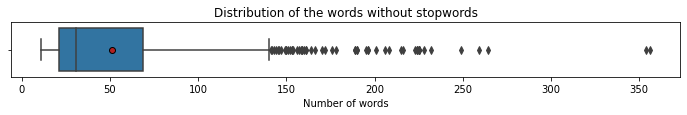

median:  31.0
mean:  50.92190476190476


In [36]:
# %%flake8

# use function boxplot_df_column to display the distribution of the words
boxplot_df_column(datas['description_split'].str.len(), 'Number of words',
                  'Distribution of the words without stopwords')

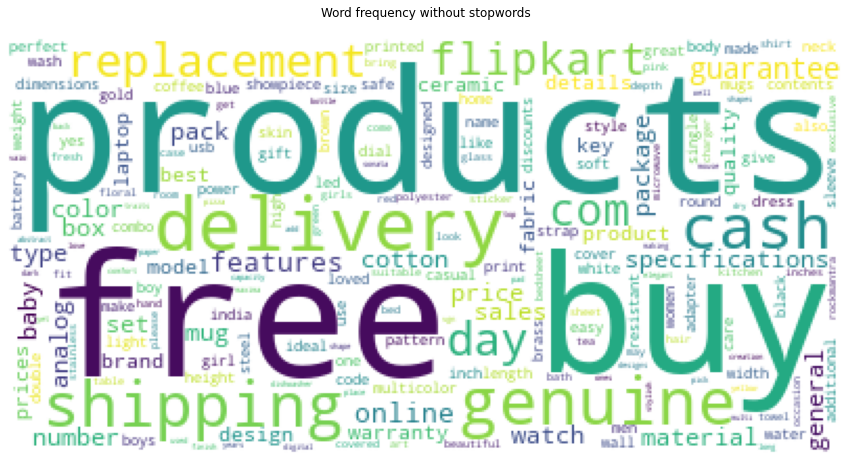

Number of words :  53468
Number of unique words :  4907


In [37]:
# %%flake8

# use function word_cloud on column description_split
word_frequence_without_stopwords, word_count_without_stopwords = word_cloud(
    datas['description_split'], title='Word frequency without stopwords')

In [38]:
# %%flake8

# Check the most frequent words > 100 times

df_word_freq = word_count_without_stopwords[
    word_count_without_stopwords['frequency'] > 100]
df_word_freq

,word,frequency
0,products,631
1,free,618
2,buy,581
3,delivery,567
4,genuine,564
5,shipping,564
6,cash,564
7,replacement,559
8,day,540
9,flipkart,481


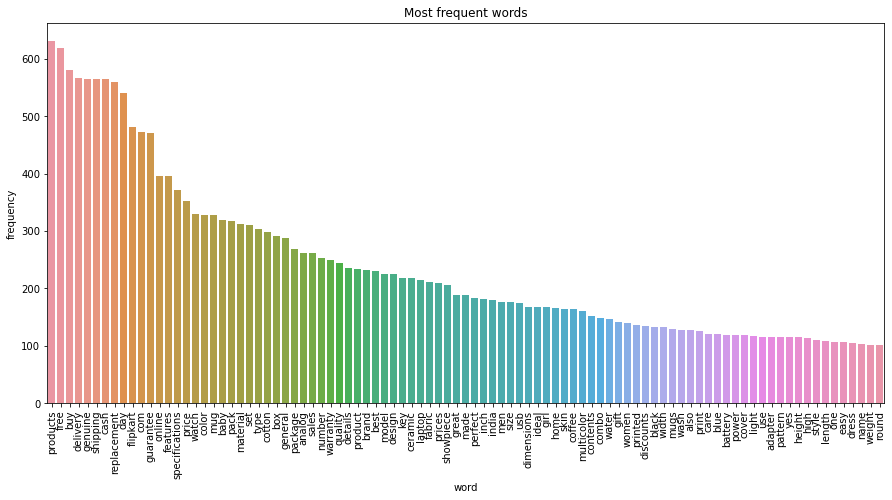

In [39]:
# %%flake8

# graph of the most frequent words > 100 times

plt.figure(figsize=(15, 7))

sns.barplot(data=df_word_freq, x="word", y="frequency")
plt.xticks(rotation=90)
plt.title('Most frequent words')
# to save graph
plt.savefig('Most frequent words.png', bbox_inches='tight')
plt.show()

After checking the most frequent words to avoid to lose information I'll remove the top 15 of words

In [40]:
# %%flake8

# add most frequent word to the stopwords list
stop_words.extend(word_count_without_stopwords.head(15)['word'].tolist())

In [41]:
# %%flake8

# remove stopwords in column description_split
datas['description_split'] = datas['description_split'].apply(
    lambda x: [item for item in x if item not in stop_words])

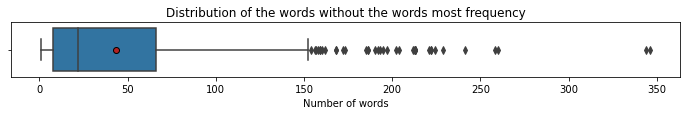

median:  22.0
mean:  43.51714285714286


In [42]:
# %%flake8

# use function boxplot_df_column to display the distribution of the words
boxplot_df_column(datas['description_split'].str.len(),
                  'Number of words', 'Distribution of the words without the words most frequency')

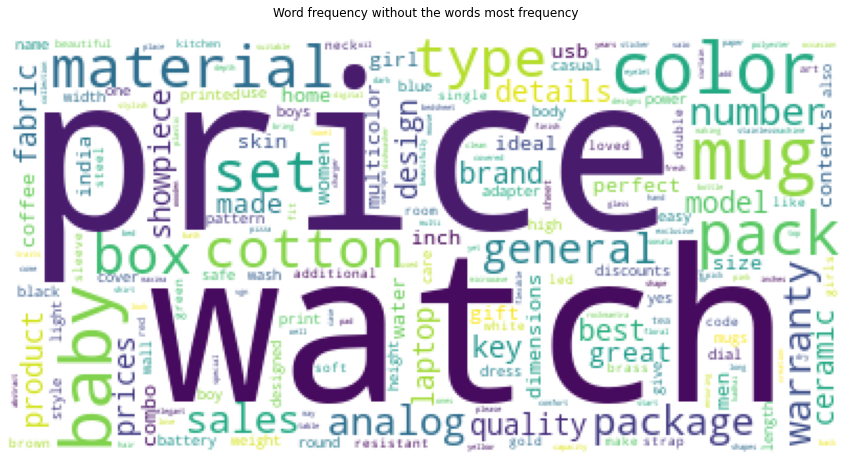

Number of words :  45693
Number of unique words :  4892


In [43]:
# %%flake8

# use function word_cloud on column description_split
word_frequence_without_all_stopwords, word_count_without_all_stopwords = \
    word_cloud(datas['description_split'],
               title='Word frequency without the words most frequency')

#### Stemming

In [44]:
# %%flake8

# Use English stemmer.
stemmer = nltk.stem.snowball.EnglishStemmer()

datas['description_split_stemming'] = datas['description_split'].apply(
    lambda x: [stemmer.stem(y) for y in x])

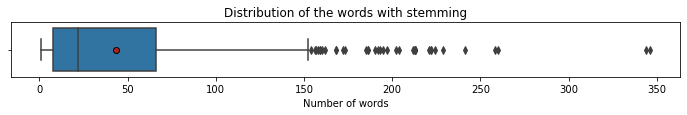

median:  22.0
mean:  43.51714285714286


In [45]:
# %%flake8

# use function boxplot_df_column to display the distribution of the words
boxplot_df_column(datas['description_split_stemming'].str.len(),
                  'Number of words', 'Distribution of the words with stemming')

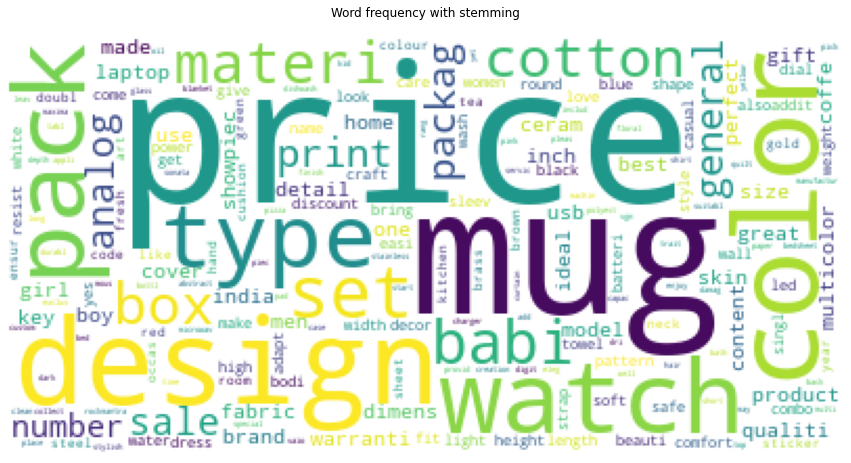

Number of words :  45693
Number of unique words :  3900


In [46]:
# %%flake8

# use function word_cloud on column description_split
word_frequence_stemming, word_count_frequence_stemming = word_cloud(
    datas['description_split_stemming'],
               title='Word frequency with stemming')

In [47]:
word_count_frequence_stemming.head(50)

,word,frequency
0,price,561
1,mug,457
2,design,401
3,color,380
4,watch,360
5,pack,342
6,type,325
7,set,324
8,babi,321
9,materi,313


#### Lemmatisation

In [48]:
# %%flake8

lemmatizer = nltk.stem.WordNetLemmatizer()

datas['description_split_lemmatisation'] = datas['description_split'].apply(
    lambda x: [lemmatizer.lemmatize(y) for y in x])

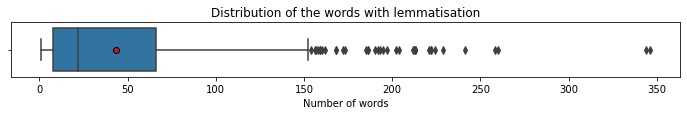

median:  22.0
mean:  43.51714285714286


In [49]:
# %%flake8

# use function boxplot_df_column to display the distribution of the words
boxplot_df_column(datas['description_split_lemmatisation'].str.len(),
                  'Number of words', 'Distribution of the words with lemmatisation')

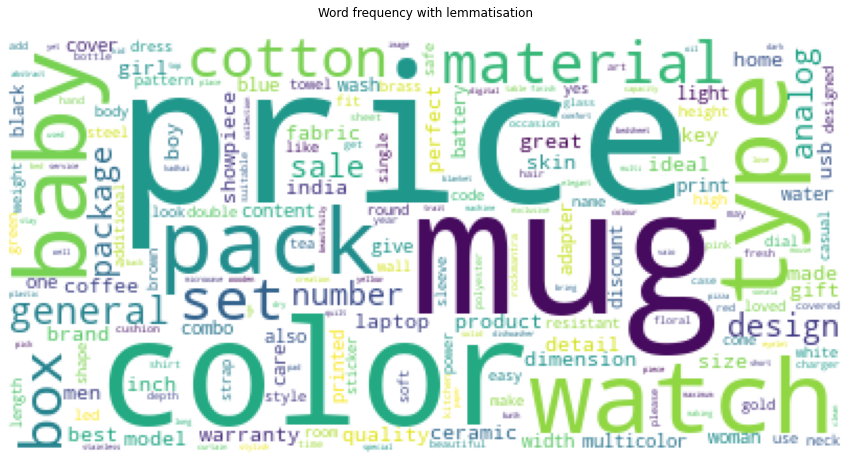

Number of words :  45693
Number of unique words :  4486


In [50]:
# %%flake8

# use function word_cloud on column description_split
word_frequence_lemmatisation, word_count_frequence_lemmatisation = word_cloud(
    datas['description_split_lemmatisation'],
               title='Word frequency with lemmatisation')

In [51]:
word_count_frequence_lemmatisation.head(50)

,word,frequency
0,price,561
1,mug,457
2,color,369
3,watch,355
4,type,325
5,baby,321
6,pack,319
7,material,313
8,set,312
9,cotton,299


In [52]:
# %%flake8

# display first entries for stemming an lemmatization
for i in range(3):
    print('\nRow :', i)
    print('Stemming:')
    print(datas['description_split_stemming'].loc[[i]])
    print('Lemmatisation:')
    print(datas['description_split_lemmatisation'].loc[[i]])


Row : 0
Stemming:
0    [key, eleg, polyest, multicolor, abstract, eyelet, door, curtain, floral, curtain, eleg, polyest, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhanc, look, interior, curtain, made, high, qualiti, polyest, fabric, eyelet, style, stitch, metal, ring, make, room, environ, romant, love, curtain, ant, wrinkl, anti, shrinkag, eleg, appar, give, home, bright, modernist, appeal, design, surreal, attent, sure, steal, heart, contemporari, eyelet, valanc, curtain, slide, smooth, draw, apart, first, thing, morn, welcom, bright, sun, ray, want, wish, good, morn, whole, world, draw, close, even, creat, special, moment, joyous, beauti, given, sooth, print, bring, home, eleg, curtain, soft, filter, light, room, get, right, ...]
Name: description_split_stemming, dtype: object
Lemmatisation:
0    [key, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, 

We can see there's less unique words with stemming, lemmatization keep more information.
To avoid lose grammatical meaning of the description I'll keep lemmatization.

In [53]:
# %%flake8

datas['description_split'] = datas['description_split_lemmatisation']

#### Create Bag of words

In [54]:
# %%flake8

# aggregate all the words of the description per product normalized in a new column
datas['description_normalized'] = datas['description_split'].apply(
    lambda x: ' '.join([word for word in x]))
datas

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,product_1st_category,product_2nd_category,product_3rd_category,description_split,description_split_stemming,description_split_lemmatisation,description_normalized
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56+00:00,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}",Home Furnishing,Curtains & Accessories,Curtains,"[key, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhances, look, interior, curtain, made, high, quality, polyester, fabric, eyelet, style, stitch, metal, ring, make, room, environment, romantic, loving, curtain, ant, wrinkle, anti, shrinkage, elegant, apparance, give, home, bright, modernistic, appeal, design, surreal, attention, sure, steal, heart, contemporary, eyelet, valance, curtain, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, ray, want, wish, good, morning, whole, world, draw, close, evening, create, special, moment, joyous, beauty, given, soothing, print, bring, home, elegant, curtain, softly, filter, light, room, get, right, ...]","[key, eleg, polyest, multicolor, abstract, eyelet, door, curtain, floral, curtain, eleg, polyest, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhanc, look, interior, curtain, made, high, qualiti, polyest, fabric, eyelet, style, stitch, meta

##### Use CountVectorizer

In [55]:
# %%flake8

# use CountVectorizer to extract features of the description of the products
vectorizer_countvectorizer = CountVectorizer()
X_countvectorizer = vectorizer_countvectorizer.fit_transform(
    datas['description_normalized'])

# check the number of products and the number of words
X_countvectorizer.shape

(1050, 4486)

##### Use tf-idf

In [56]:
# %%flake8

# use TfidfVectorizer to extract features of the description of the products

vectorizer_tfidf = TfidfVectorizer()
X_tfidf = vectorizer_tfidf.fit_transform(datas['description_normalized'])

# check the number of products and the number of words
X_tfidf.shape

(1050, 4486)

## Dimension reduction

### PCA

#### Countvectorizer

In [57]:
# %%flake8

def calculate_pca(data, normalization=StandardScaler(), nb_components=None):
    """ create a function to calculate PCA """

    X = data
    # create the object
    scaler = normalization

    # Calculate the mean and standard deviation
    # for each variable in the dataset
    scaler.fit(X)

    # tranform the values
    X_scaled = scaler.transform(X)

    # apply PCA for the dataset
    pca = PCA(n_components=nb_components, random_state=rd_state)
    pca.fit(X_scaled)
    X_pca = pca.transform(X_scaled)

    return pca, X_pca, X_scaled

In [58]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_countvectorizer, X_pca_countvectorizer, \
    X_scaled_countvectorizer = calculate_pca(
        X_countvectorizer.toarray(), normalization=Normalizer(),
        nb_components=0.99)

print("Dimensions dataset before PCA reduction : ",
      X_countvectorizer.toarray().shape)
print("Dimensions dataset after PCA reduction : ", X_pca_countvectorizer.shape)

Dimensions dataset before PCA reduction :  (1050, 4486)
Dimensions dataset after PCA reduction :  (1050, 752)


In [59]:
# %%flake8

def display_factorial_planes(pca, X_pca, dim1, dim2, title, datas_to_hue=None):
    """ create function du display the factorial planes of PCA"""
    
    dim1_variance_explained = pca.explained_variance_ratio_[dim1-1]*100
    dim2_variance_explained = pca.explained_variance_ratio_[dim2-1]*100
    plt.figure(figsize=(10, 7))

    if datas_to_hue is None:
        sns.scatterplot(x=X_pca[:, dim1-1],
                        y=X_pca[:, dim2-1], s=70, palette="tab10")
    else:
        sns.scatterplot(x=X_pca[:, dim1-1], y=X_pca[:, dim2-1],
                        s=70, hue=datas_to_hue,
                        hue_order=sorted(datas_to_hue.value_counts().index),
                        palette="tab10")
    plt.title('2D scatterplot: {:.2f}% of the variability captured'.format(
        dim1_variance_explained+dim2_variance_explained), pad=15)
    plt.xlabel('Dim {} ({:.2f}%)'.format(dim1, dim1_variance_explained))
    plt.ylabel('Dim {} ({:.2f}%)'.format(dim2, dim2_variance_explained))
    
    # to save graph
    plt.savefig('2D scatterplot ' + title + '.png', bbox_inches='tight')
    
    plt.show()

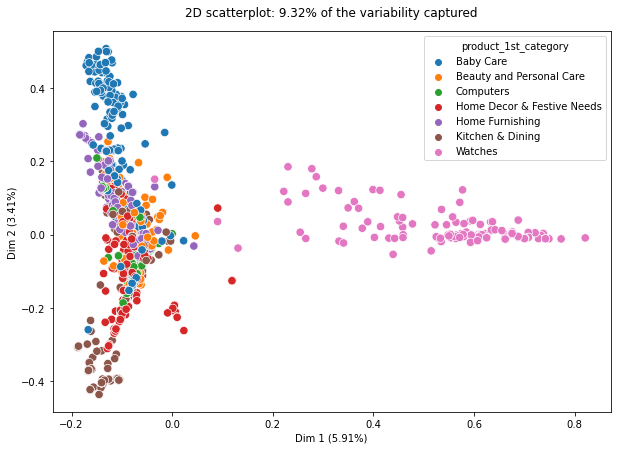

In [60]:
# %%flake8

# use function display_factorial_planes to display PCA with 1st catagory
display_factorial_planes(pca_countvectorizer, X_pca_countvectorizer,
                         1, 2, 'Countvectorizer', datas['product_1st_category'])

#### tf-idf

In [61]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_tfidf, X_pca_tfidf, X_scaled_tfidf = calculate_pca(
    X_tfidf.toarray(), normalization=Normalizer(), nb_components=0.99)

print("Dimensions dataset before PCA reduction : ",
      X_tfidf.toarray().shape)
print("Dimensions dataset after PCA reduction : ", X_pca_tfidf.shape)

Dimensions dataset before PCA reduction :  (1050, 4486)
Dimensions dataset after PCA reduction :  (1050, 794)


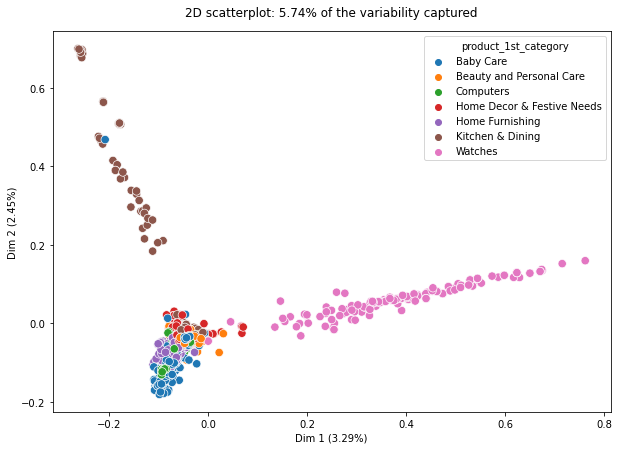

In [62]:
# %%flake8

# use function display_factorial_planes to display PCA with 1st catagory
display_factorial_planes(pca_tfidf, X_pca_tfidf, 1, 2, 'tf-idf',
                         datas['product_1st_category'])

### t-SNE

#### Countvectorizer

In [63]:
# %%flake8

def tsne_display(data, title, datas_to_hue=None):
    """ Create a function to display t-SNE """
    
    tsne = TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=rd_state).fit_transform(data)

    plt.figure(figsize=(10, 10))
    sns.scatterplot(x=tsne[:, 0], y=tsne[:, 1],
                    hue=datas_to_hue, palette="tab10")

    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title(title)

    # to save graph
    plt.savefig(title + '.png', bbox_inches='tight')
    plt.show()
    
    return tsne

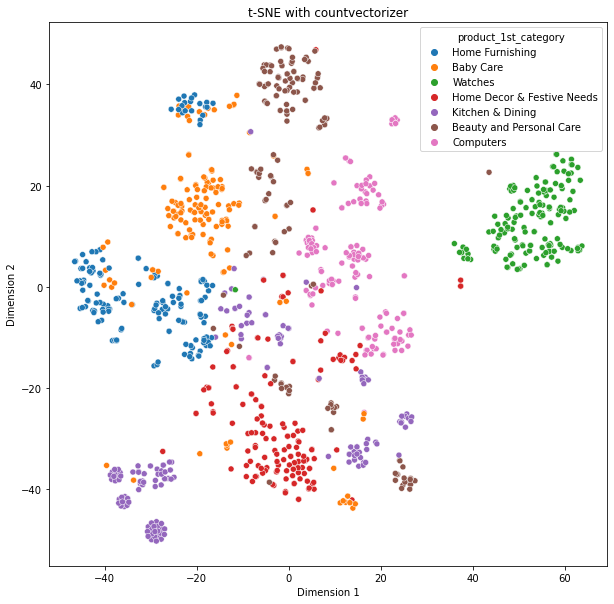

In [64]:
# %%flake8

# display tsne for countvectorizer
tsne_countvectorizer = tsne_display(X_pca_countvectorizer,
                                    't-SNE with countvectorizer',
                                    datas['product_1st_category'])

#### tf-idf

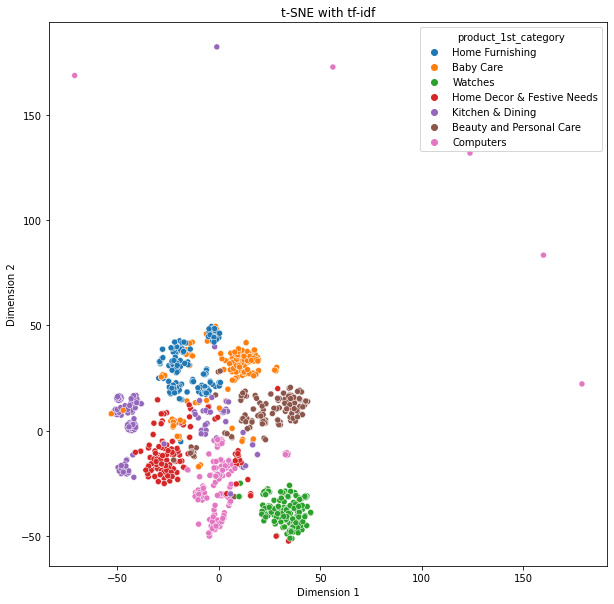

In [65]:
# %%flake8

# display tsne for tf-idf
tsne_tfidf = tsne_display(X_pca_tfidf,
                          't-SNE with tf-idf', datas['product_1st_category'])

## Clustering

In [66]:
# product_1st_category need to be encoded to calculate ARI score
le = LabelEncoder()
le.fit(datas['product_1st_category'])

prod_cat_encoded = le.transform(datas['product_1st_category'])

# add column to datas with product category encoded
datas = datas.join(pd.DataFrame(prod_cat_encoded, columns=['product_1st_category_encoded']))

### KMeans

#### Countvectorizer

In [67]:
# %%flake8

def kmeans_clustering(data, nb_clusters, random_state=None):
    """ create a function to calculate clusters label with KMeans"""
    
    kmeans_model = KMeans(
        n_clusters=nb_clusters, random_state=random_state).fit(data)

    # return labels calculated
    return kmeans_model.labels_

In [68]:
# %%flake8

# use function kmeans_clustering to calculate clusters label with countvectorizer
labels_countvectorizer = kmeans_clustering(X_pca_countvectorizer, 7, rd_state)

In [69]:
# %%flake8

def merge_clust_label(data, labels, col_name):
    """ create a function to add column with cluster
    label calculated to the datas """
    
    # dataframe of the clusters labels
    df_labels = pd.DataFrame(labels, columns=[col_name])
    if col_name in data:
        data.drop(labels=col_name, axis="columns", inplace=True)
    return data.join(df_labels)

In [70]:
# %%flake8

# add column with cluster label to the datas
datas = merge_clust_label(datas, labels_countvectorizer,
                          'KMeans countvectorizer')

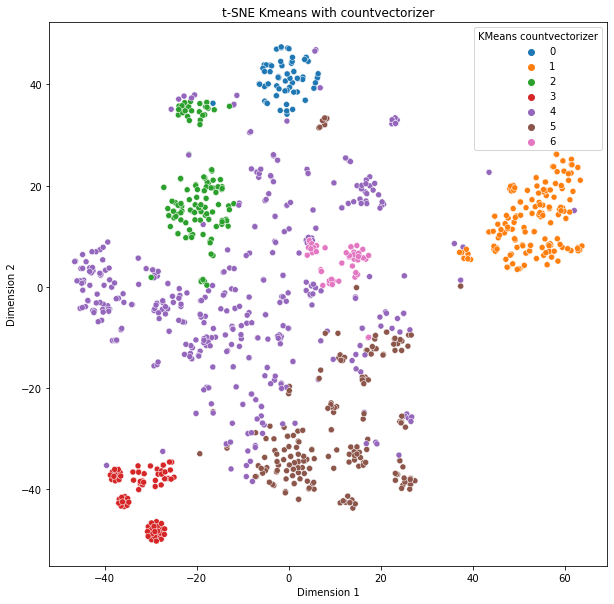

In [71]:
# %%flake8

# display tsne for countvectorizer
tsne_kmeans_countvectorizer = tsne_display(X_pca_countvectorizer,
                                           't-SNE Kmeans with countvectorizer',
                                           datas['KMeans countvectorizer'])

In [72]:
# %%flake8

# calculate and save the ARI score
score_ari_countvectorizer = adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['KMeans countvectorizer'])
print("ARI score : ", score_ari_countvectorizer)

ARI score :  0.3029069564595599


In [73]:
# %%flake8

# create a dataframe to store results
score_ari_result = pd.DataFrame(columns=[
                             'Feature type', 'Features extractor',
                             'ARI score'])

# store results in score_ari_result
score_ari_result = score_ari_result.append(
    {'Feature type': 'Text', 'Features extractor': 'Countvectorizer',
     'ARI score': score_ari_countvectorizer}, ignore_index=True)

In [74]:
# %%flake8

def confusion_matrix(categories, clusters, title):
    """ Create a function to display confusion matrix """

    plt.figure(figsize=(10, 8))
    sns.heatmap(pd.crosstab(categories,
                            clusters), annot=True, fmt='g')
    plt.xlabel('Clusters')
    plt.ylabel('Product 1st category')
    plt.title(title)

    # to save graph
    plt.savefig(title + '.png', bbox_inches='tight')
    plt.show()

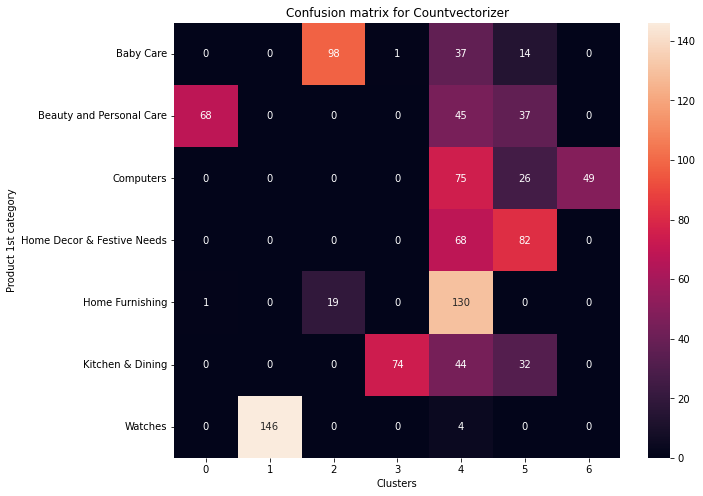

In [75]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_countvectorizer,
                 'Confusion matrix for Countvectorizer')

#### tf-idf

In [76]:
# %%flake8

# use function kmeans_clustering to calculate clusters label with countvectorizer
labels_tfidf = kmeans_clustering(X_pca_tfidf, 7, rd_state)

In [77]:
# %%flake8

# add column with cluster label to the datas
datas = merge_clust_label(datas, labels_tfidf,
                          'KMeans tfidf')

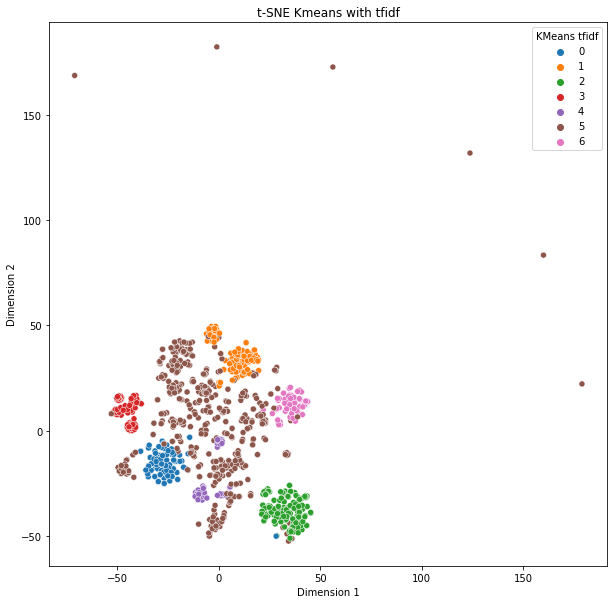

In [78]:
# %%flake8

# display tsne for countvectorizer
tsne_kmeans_tfidf = tsne_display(X_pca_tfidf,
                                 't-SNE Kmeans with tfidf',
                                 datas['KMeans tfidf'])

In [79]:
# %%flake8

# calculate and save the ARI score
score_ari_tfidf = adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['KMeans tfidf'])
print("ARI score : ", score_ari_tfidf)

ARI score :  0.2783408091765411


In [80]:
# %%flake8

# store results in score_ari_result
score_ari_result = score_ari_result.append(
    {'Feature type': 'Text', 'Features extractor': 'tf-idf',
     'ARI score': score_ari_tfidf}, ignore_index=True)

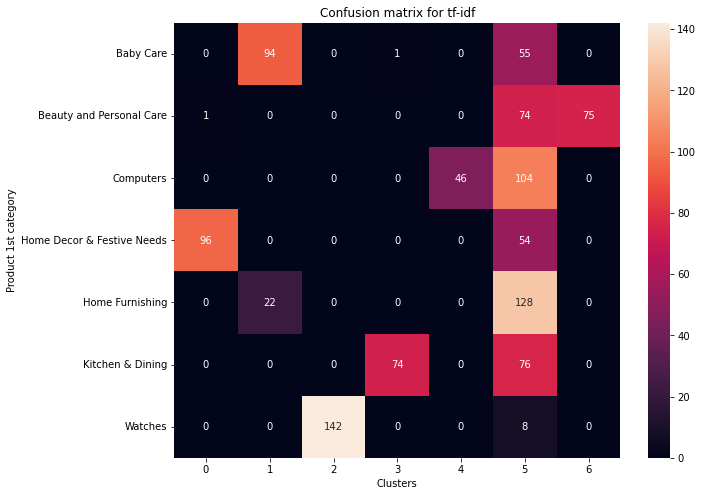

In [81]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_tfidf,
                 'Confusion matrix for tf-idf')

### MiniBatchKMeans

#### Countvectorizer

In [82]:
# %%flake8

def minibatchkmeans_clustering(data, nb_clusters, random_state=None):
    """ create a function to calculate clusters label with MiniBatchKMeans """

    minibatchkmeans_model = MiniBatchKMeans(
        n_clusters=nb_clusters, random_state=random_state,
        batch_size=2048).fit(data)

    # return labels calculated
    return minibatchkmeans_model.labels_

In [83]:
# %%flake8

# use function minibatchkmeans_clustering to calculate clusters label with countvectorizer
labels_minicount = minibatchkmeans_clustering(X_pca_countvectorizer, 7, rd_state)

In [84]:
# %%flake8

# add column with cluster label to the datas
datas = merge_clust_label(datas, labels_minicount,
                          'MiniBatchKMeans X_count')

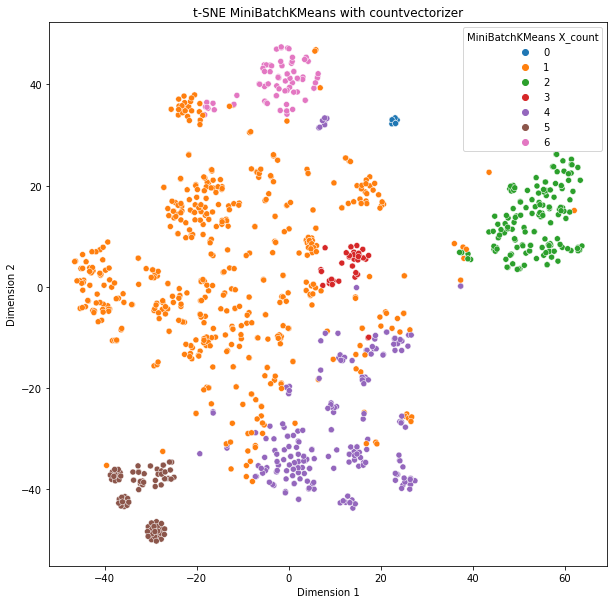

In [85]:
# %%flake8

# display tsne for countvectorizer
tsne_mini_count = tsne_display(X_pca_countvectorizer,
                               't-SNE MiniBatchKMeans with countvectorizer',
                               datas['MiniBatchKMeans X_count'])

In [86]:
# %%flake8

# calculate and save the ARI score
adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['MiniBatchKMeans X_count'])

0.23827052804620866

#### tf-idf

In [87]:
# %%flake8

# use function minibatchkmeans_clustering to calculate clusters label with countvectorizer
labels_min_tfidf = minibatchkmeans_clustering(X_pca_tfidf, 7, rd_state)

In [88]:
# %%flake8

# add column with cluster label to the datas
datas = merge_clust_label(datas, labels_min_tfidf,
                          'MiniBatchKMeans X_tfidf')

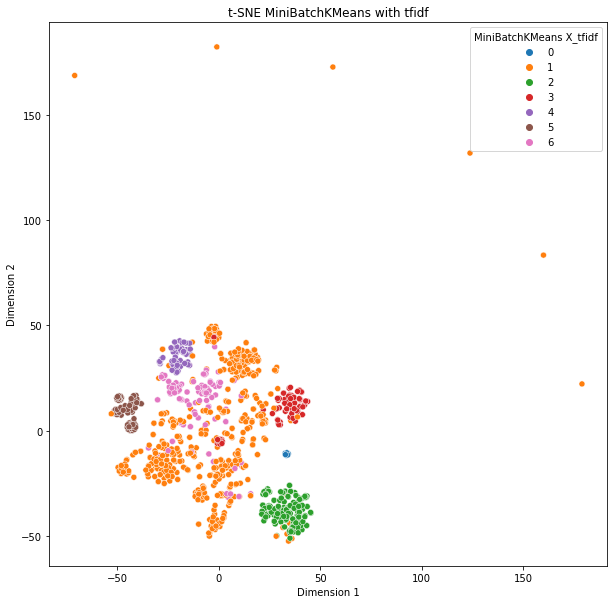

In [89]:
# %%flake8

# display tsne for countvectorizer
tsne_min_tfidf = tsne_display(X_pca_tfidf,
                              't-SNE MiniBatchKMeans with tfidf',
                              datas['MiniBatchKMeans X_tfidf'])

In [90]:
# %%flake8
# calculate and save the ARI score
adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['MiniBatchKMeans X_tfidf'])

0.2313124160498765

## Universal Sentence Encoder

In [91]:
module_url = "https://tfhub.dev/google/universal-sentence-encoder-large/5"
# Import the Universal Sentence Encoder's TF Hub module
model_use = hub.load(module_url)

### Features extraction

In [92]:
message_embeddings = model_use(datas['description'].values)

In [93]:
use_feature_list = tf.make_ndarray(tf.make_tensor_proto(message_embeddings))

In [94]:
use_feature_list

array([[-0.00916469,  0.03944718,  0.01595419, ...,  0.05886477,
        -0.0004368 , -0.03250405],
       [ 0.01545703,  0.08243532, -0.03744726, ..., -0.02184851,
         0.01142744, -0.05121248],
       [-0.07546019,  0.06700462,  0.04915042, ...,  0.01540867,
        -0.00374416, -0.0473857 ],
       ...,
       [ 0.00865305,  0.02998203, -0.03225389, ..., -0.00312422,
         0.01914149,  0.00852429],
       [ 0.01860688, -0.065983  , -0.00209924, ...,  0.04083692,
         0.0341423 , -0.04228526],
       [ 0.00907928, -0.06332264, -0.01529481, ...,  0.03331296,
         0.00726598, -0.03579938]], dtype=float32)

In [95]:
datas['text_descriptors_use'] = use_feature_list.tolist()

In [96]:
datas

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,product_1st_category,product_2nd_category,product_3rd_category,description_split,description_split_stemming,description_split_lemmatisation,description_normalized,product_1st_category_encoded,KMeans countvectorizer,KMeans tfidf,MiniBatchKMeans X_count,MiniBatchKMeans X_tfidf,text_descriptors_use
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56+00:00,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}",Home Furnishing,Curtains & Accessories,Curtains,"[key, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, height, pack, price, curtain, enhances, look, interior, curtain, made, high, quality, polyester, fabric, eyelet, style, stitch, metal, ring, make, room, environment, romantic, loving, curtain, ant, wrinkle, anti, shrinkage, elegant, apparance, give, home, bright, modernistic, appeal, design, surreal, attention, sure, steal, heart, contemporary, eyelet, valance, curtain, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, ray, want, wish, good, morning, whole, world, draw, close, evening, create, special, moment, joyous, beauty, given, soothing, print, bring, home, elegant, curtain, softly, filter, light, room, get, right, ...]","[key, eleg, polyest, multicolor, abstract, eyelet, door, curtain, floral, curtain, eleg, polyest, multicolor, abstract, eyelet, door, cur

### Dimension reduction

In [97]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_use, X_pca_use, X_scaled_use = calculate_pca(
    use_feature_list, normalization=Normalizer(), nb_components=0.99)

print("Dimensions dataset before PCA reduction : ", use_feature_list.shape)
print("Dimensions dataset after PCA reduction : ", X_pca_use.shape)

Dimensions dataset before PCA reduction :  (1050, 512)
Dimensions dataset after PCA reduction :  (1050, 280)


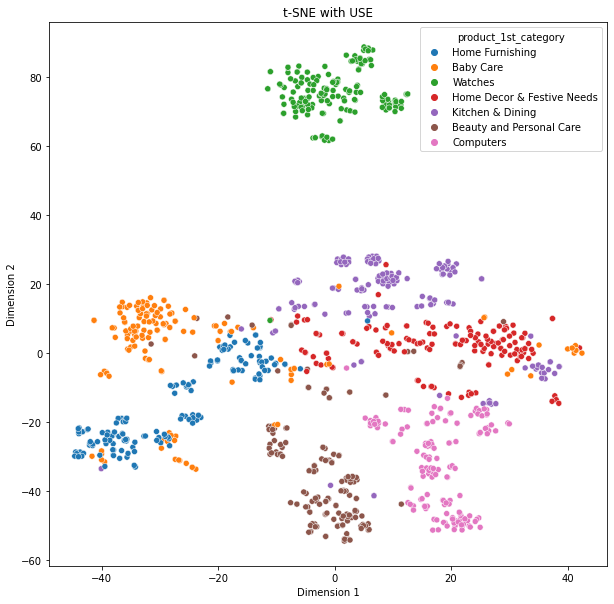

In [98]:
# %%flake8

# use function tsne_display to reduce dimension and display tsne for USE
tsne_use = tsne_display(X_pca_use, 't-SNE with USE',
                         datas['product_1st_category'])

### Clustering

In [99]:
# %%flake8

# use function kmeans_clustering to calculate clusters
# label with USE

labels_use = kmeans_clustering(X_pca_use, 7, rd_state)

In [100]:
# %%flake8

# add column with USE cluster label to the datas
datas = merge_clust_label(datas, labels_use,
                          'KMeans_use')

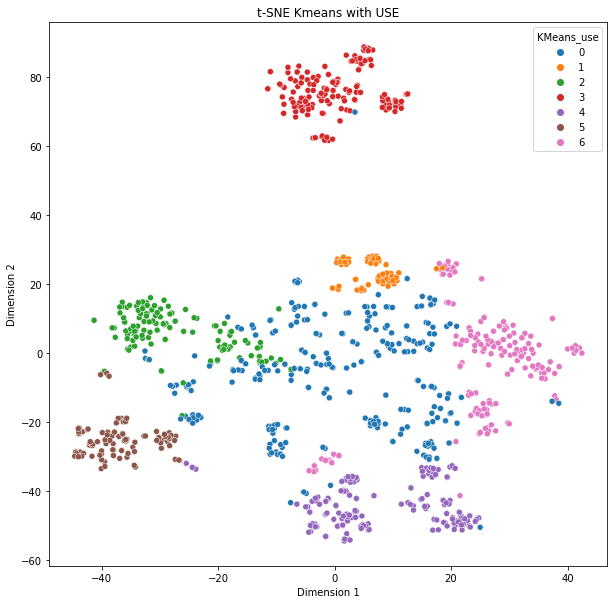

In [101]:
# %%flake8

# display tsne for USE
tsne_kmeans_use = tsne_display(X_pca_use,
                                't-SNE Kmeans with USE',
                                datas['KMeans_use'])

In [102]:
# %%flake8

# calculate and save the ARI score
score_ari_use = adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['KMeans_use'])
print("ARI score : ", score_ari_use)

ARI score :  0.3357843692426389


In [103]:
# %%flake8

# store results in score_ari_result
score_ari_result = score_ari_result.append(
    {'Feature type': 'Text',
     'Features extractor': 'Universal sentence encoder',
     'ARI score': score_ari_use}, ignore_index=True)

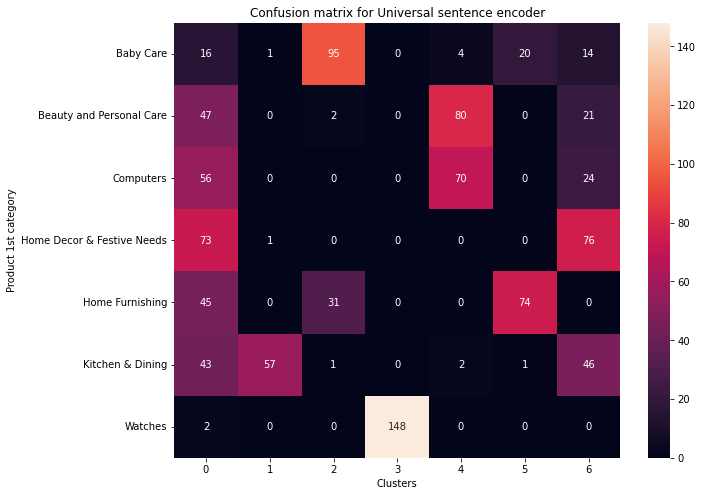

In [104]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_use,
                 'Confusion matrix for Universal sentence encoder')

# Images analyzis

## Exploration of images

In [105]:
# %%flake8

# create a list of product_1st_category
list_1st_cataegory = datas['product_1st_category'].unique()

--------------------------------------------------
Home Furnishing


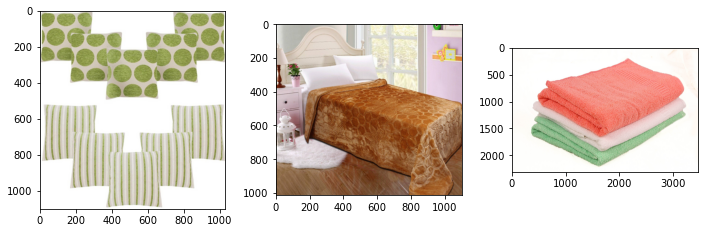

--------------------------------------------------
Baby Care


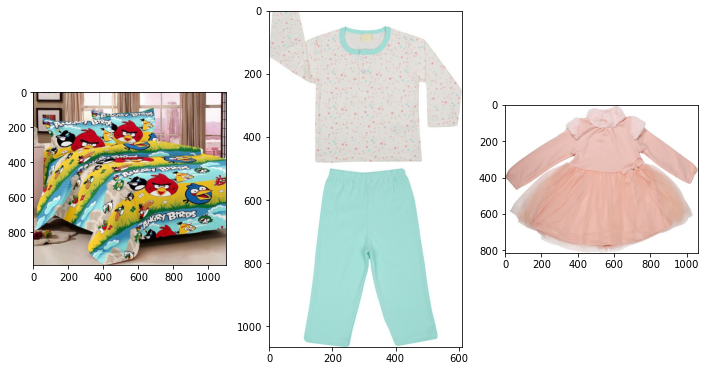

--------------------------------------------------
Watches


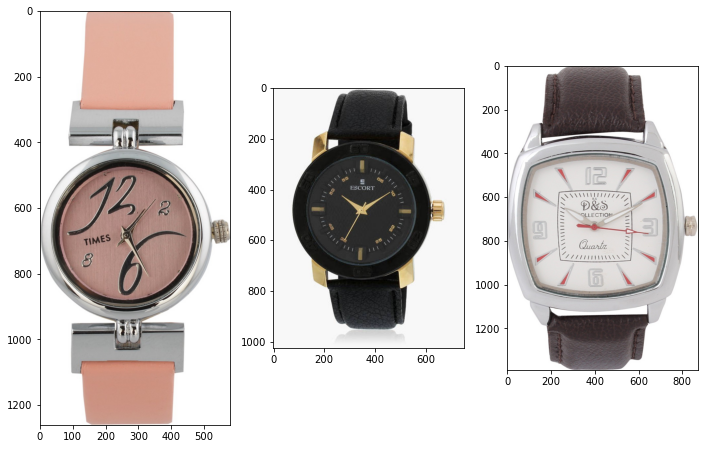

--------------------------------------------------
Home Decor & Festive Needs


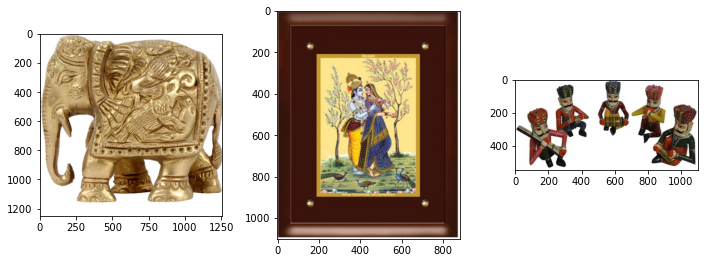

--------------------------------------------------
Kitchen & Dining


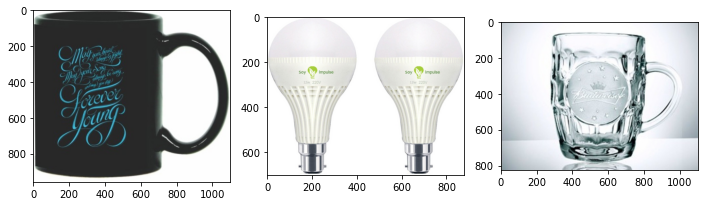

--------------------------------------------------
Beauty and Personal Care


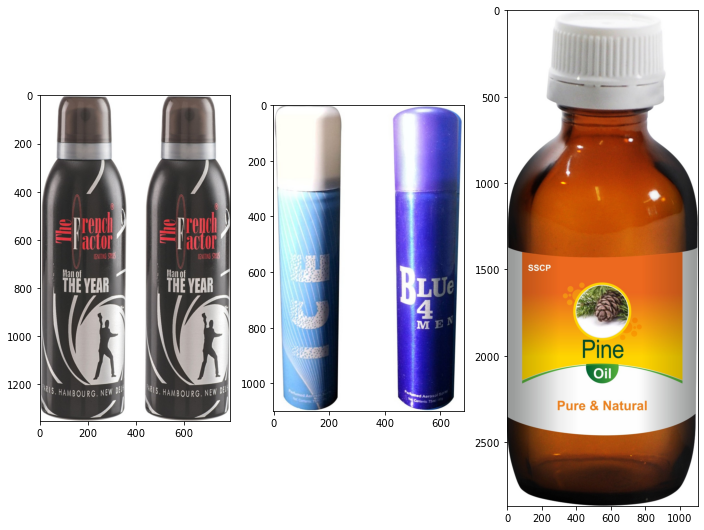

--------------------------------------------------
Computers


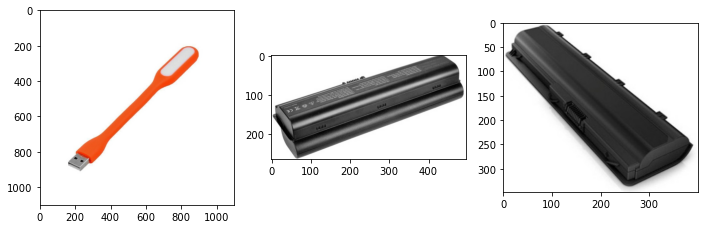

In [106]:
# %%flake8

# display 3 pictures of each categories
nb_pictures = 3

for i in list_1st_cataegory:
    plt.figure(figsize=(10, 10))
    print("-"*50)
    print(i)
    # create a sample of 3 products for the category
    df_sample = datas[datas['product_1st_category'] == i].sample(n=nb_pictures)
    
    # display pictures of the category
    for j in range(nb_pictures):
        plt.subplot(1, nb_pictures, 1+j)
        img = cv2.imread('Flipkart/Images/' + df_sample['image'].iloc[j])
        # to display with colors RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.tight_layout(h_pad=2)
        plt.imshow(img_rgb)
    plt.show()

We can see picture are in color and with different size, I'll normalize it

## Normalization of images

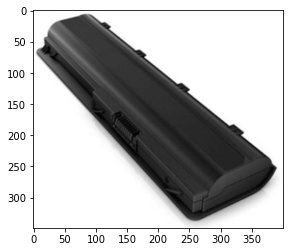

In [107]:
# %%flake8

# convert image in gray
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(img_gray, cmap='gray')

# to save graph
plt.savefig('image in gray.png', bbox_inches='tight')

plt.show()

In [108]:
# %%flake8

def image_resize(img, size, interpolation=cv2.INTER_AREA):
    """ function to resize image to square and keep aspect ratio """
    
    # initialize the dimensions of the image to be resized and
    # grab the image size
    h, w = img.shape[:2]

    # check if image in color
    c = None if len(img.shape) < 3 else img.shape[2]

    if h == w:
        return cv2.resize(img, (size, size), interpolation)

    if h > w:
        dif = h
    else:
        dif = w

    x_pos = int((dif - w)/2.)
    y_pos = int((dif - h)/2.)

    if c is None:
        # square filler in white
        mask = np.full((dif, dif), fill_value=255, dtype=img.dtype)
        # center image inside the square
        mask[y_pos:y_pos+h, x_pos:x_pos+w] = img[:h, :w]
    else:
        # square filler in white
        mask = np.full((dif, dif, c), fill_value=255, dtype=img.dtype)
        # center image inside the square
        mask[y_pos:y_pos+h, x_pos:x_pos+w, :] = img[:h, :w, :]

    return cv2.resize(mask, (size, size), interpolation)

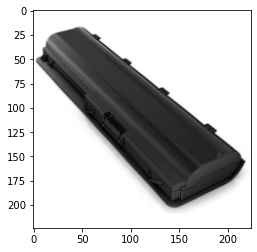

In [109]:
# %%flake8

# use function image_resize to resize and keep ratio
img_resized = image_resize(img_gray, 224)
plt.imshow(img_resized, cmap='gray')

# to save graph
plt.savefig('image resized.png', bbox_inches='tight')

plt.show()

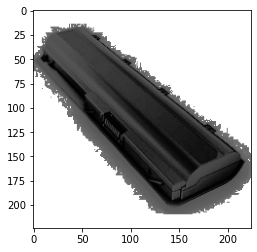

In [110]:
# %%flake8

# Adjuste de contrast and brightness

img_normalized = cv2.equalizeHist(img_resized)
plt.imshow(img_normalized, cmap='gray')

# to save graph
plt.savefig('image histogram equalized.png', bbox_inches='tight')

plt.show()

In [111]:
# %%flake8

def normalize_image(image, size=224):
    """ create a function to normalize image, open it,
    convert in gray, resize and equalize historgram"""
    
    # open image
    img = cv2.imread('Flipkart/Images/' + image)

    # convert image in gray
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # resize image
    img_resized = image_resize(img_gray, size=size)

    # Adjuste de contrast and brightness
    img_normalized = cv2.equalizeHist(img_resized)
    return img_normalized

In [112]:
# %%flake8

# use function normalize_image on all image of
# the products and store it in the dataframe
datas['image_normalized'] = datas['image'].apply(normalize_image)

--------------------------------------------------
Home Furnishing


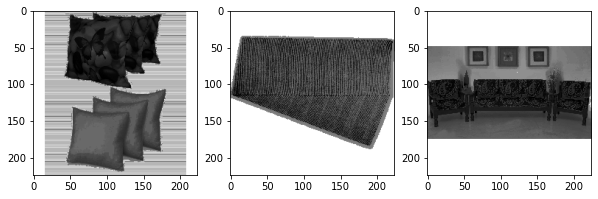

--------------------------------------------------
Baby Care


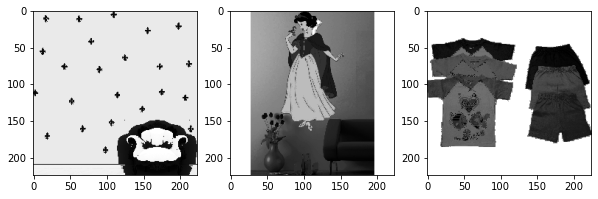

--------------------------------------------------
Watches


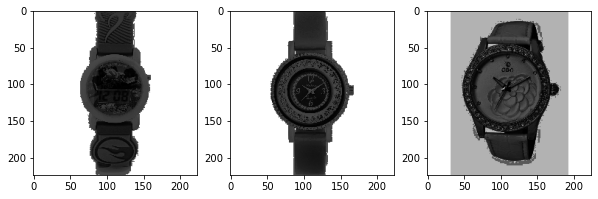

--------------------------------------------------
Home Decor & Festive Needs


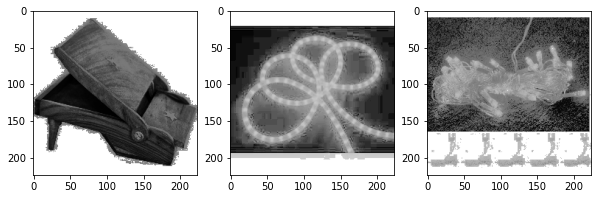

--------------------------------------------------
Kitchen & Dining


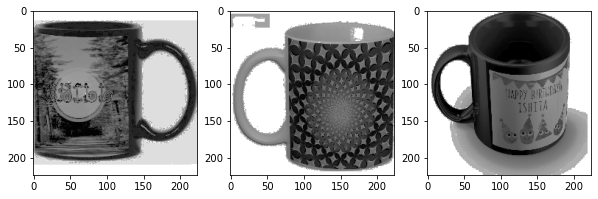

--------------------------------------------------
Beauty and Personal Care


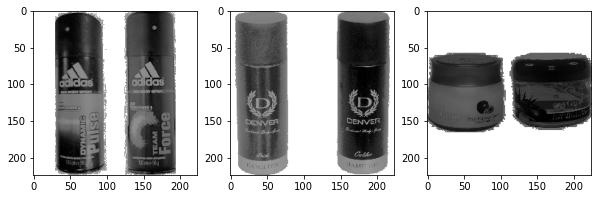

--------------------------------------------------
Computers


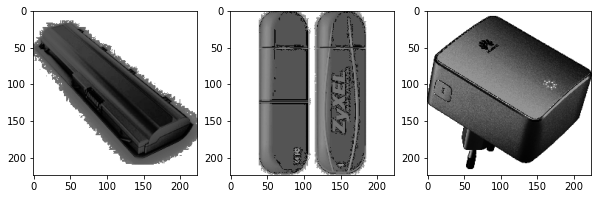

In [113]:
# %%flake8

# display 3 pictures normalized of each categories
nb_pictures = 3

for i in list_1st_cataegory:
    plt.figure(figsize=(10, 10))
    print("-"*50)
    print(i)
    # create a sample of 3 products for the category
    df_sample = datas[datas['product_1st_category'] == i].sample(n=nb_pictures)

    # display pictures of the category
    for j in range(nb_pictures):
        plt.subplot(1, nb_pictures, 1+j)
        img = df_sample['image_normalized'].iloc[j]
        # to display in gray
        plt.imshow(img, cmap='gray')
    plt.show()

## Feature detection

### SIFT

#### Identification of descriptors

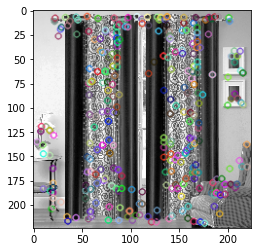

Number of descriptors :  341
Descriptor vector size :  128

Descriptor :
[[  0.   0.  40. ...  19.  39.  31.]
 [ 17.   1.   1. ...   5.   4.   4.]
 [  0.   3.   2. ...   0.   3.   6.]
 ...
 [  3.   0.   0. ...  10.  43.   0.]
 [  0.  10. 156. ...   0.   0.   0.]
 [  1.   0.   0. ...   0.   0.  23.]]


In [114]:
# %%flake8

# Extraction of key points and associated descriptors for an image
sift = cv2.xfeatures2d.SIFT_create()
image = datas['image_normalized'].iloc[0]
kp_sift, des_sift = sift.detectAndCompute(image, None)

# display image with key points
img = cv2.drawKeypoints(image, kp_sift, image)
plt.imshow(img)

# to save graph
plt.savefig('image with key points with SIFT.png', bbox_inches='tight')

plt.show()

print("Number of descriptors : ", des_sift.shape[0])
print("Descriptor vector size : ", des_sift.shape[1])

print("\nDescriptor :")
print(des_sift)

In [115]:
# %%flake8

# identification of key points and associated descriptors for all images
nb_features = 500
sift = cv2.xfeatures2d.SIFT_create(nfeatures=nb_features)

def descriptor_sift(image):
    """ Create a function to identify the descriptors and key points """
    
    kp_sift, des_sift = sift.detectAndCompute(image, None)
    return des_sift

In [116]:
# %%flake8

# use function decriptor to add descriptors to all images
datas['image_descriptors_sift'] = datas['image_normalized'].apply(descriptor_sift)

In [117]:
# %%flake8

# Number total of descriptors for all images
sift_keypoints_all = np.concatenate(datas['image_descriptors_sift'], axis=0)
print("Nunmber total of descriptors for SIFT : ", sift_keypoints_all.shape[0])

Nunmber total of descriptors for SIFT :  224455


#### Clustering of descriptors

In [118]:
# %%flake8

# Determination number of clusters
k = int(round(np.sqrt(len(sift_keypoints_all)), 0))
print("Number of estimated clusters : ", k)

# Clustering, use MiniBatchKMeans for faster processing
kmeans_sift = MiniBatchKMeans(n_clusters=k, init_size=3*k,
                         random_state=rd_state, batch_size=2048)
kmeans_sift.fit(sift_keypoints_all)

Number of estimated clusters :  474


MiniBatchKMeans(batch_size=2048, init_size=1422, n_clusters=474,
                random_state=13)

#### Creation of histogram (bags-of-visual-words)

In [119]:
# %%flake8

# Creation of histograms (features)

def build_histogram(kmeans, des):
    """ Create function to build historgram """
    
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des = len(des)
    if nb_des == 0:
        print("problème histogramme image")
    for i in res:
        hist[i] += 1.0/nb_des
    return hist

In [120]:
# %%flake8

# Creation of a matrix of histograms
hist_vectors = []
for index, row in datas.iterrows():
    # calculates the histogram
    hist = build_histogram(kmeans_sift, row['image_descriptors_sift'])
    # histogram is the feature vector
    hist_vectors.append(hist)

im_features_sift = np.asarray(hist_vectors)

#### Dimension reduction

In [121]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_sift, X_pca_sift,X_scaled_sift = calculate_pca(
    im_features_sift, normalization=Normalizer(), nb_components=0.99)

print("Dimensions dataset before PCA reduction : ", im_features_sift.shape)
print("Dimensions dataset after PCA reduction : ", X_pca_sift.shape)

Dimensions dataset before PCA reduction :  (1050, 474)
Dimensions dataset after PCA reduction :  (1050, 416)


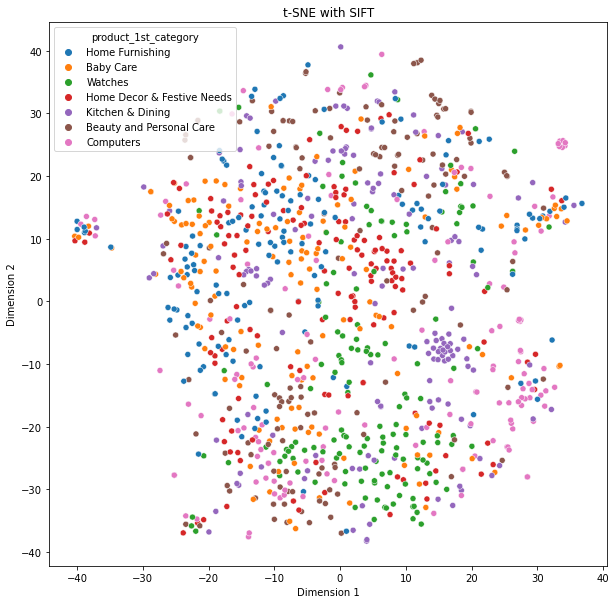

In [122]:
# %%flake8

# use function tsne_display to reduce dimension and display tsne for SIFT
tsne_sift = tsne_display(X_pca_sift, 't-SNE with SIFT',
                         datas['product_1st_category'])

#### Clustering

In [123]:
# %%flake8

# use function kmeans_clustering to calculate clusters
# label with countvectorizer

labels_sift = kmeans_clustering(X_pca_sift, 7, rd_state)

In [124]:
# %%flake8

# add column with sift cluster label to the datas
datas = merge_clust_label(datas, labels_sift,
                          'KMeans_sift')

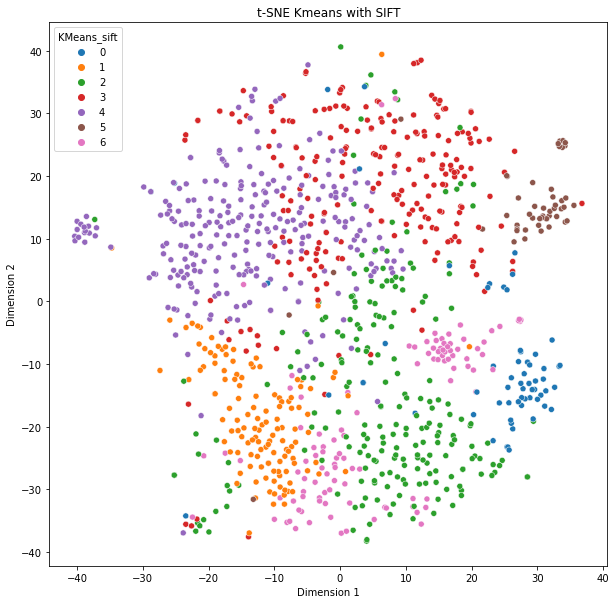

In [125]:
# %%flake8

# display tsne for countvectorizer
tsne_kmeans_sift = tsne_display(X_pca_sift,
                                't-SNE Kmeans with SIFT',
                                datas['KMeans_sift'])

In [126]:
# %%flake8

# calculate and save the ARI score
score_ari_sift = adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['KMeans_sift'])
print("ARI score : ", score_ari_sift)

ARI score :  0.06753077366353033


In [127]:
# %%flake8

# store results in score_ari_result
score_ari_result = score_ari_result.append(
    {'Feature type': 'Image',
     'Features extractor': 'SIFT',
     'ARI score': score_ari_sift}, ignore_index=True)

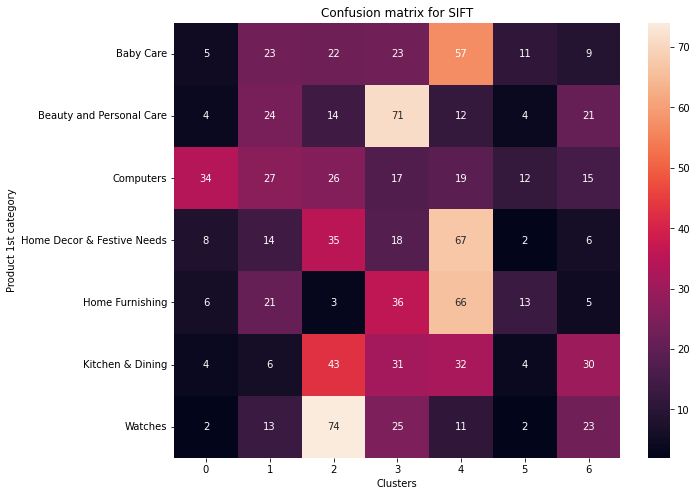

In [128]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_sift,
                 'Confusion matrix for SIFT')

### ORB

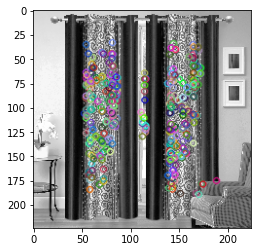

Number of descriptors :  402
Descriptor vector size :  32

Descriptor :
[[191 253 119 ... 223 134 247]
 [205 221 183 ... 247 167 255]
 [ 79 236 230 ... 245  21  46]
 ...
 [240  97   2 ...   0  34 130]
 [201  51  43 ... 134   3 113]
 [ 98 172 110 ...  12  86 222]]


In [129]:
# %%flake8

# Extraction of key points and associated descriptors for an image
orb = cv2.ORB_create()
image = datas['image_normalized'].iloc[0]
kp_orb, des_orb = orb.detectAndCompute(image, None)

# display image with key points
img = cv2.drawKeypoints(image, kp_orb, image)
plt.imshow(img)

# to save graph
plt.savefig('image with key points with ORB.png', bbox_inches='tight')

plt.show()

print("Number of descriptors : ", des_orb.shape[0])
print("Descriptor vector size : ", des_orb.shape[1])

print("\nDescriptor :")
print(des_orb)

In [130]:
# %%flake8

# identification of key points and associated descriptors for all images
nb_features = 500
orb = cv2.ORB_create(nfeatures=nb_features)

def descriptor_orb(image):
    """ Create a function to identify the descriptors and key points """
    
    kp_orb, des_orb = orb.detectAndCompute(image, None)
    return des_orb

In [131]:
# %%flake8

# use function decriptor to add descriptors to all images
datas['image_descriptors_orb'] = datas['image_normalized'].apply(descriptor_orb)

In [132]:
# %%flake8

# Number total of descriptors for all images
orb_keypoints_all = np.concatenate(datas['image_descriptors_orb'], axis=0)
print("Nunmber total of descriptors for ORB : ", orb_keypoints_all.shape[0])

Nunmber total of descriptors for ORB :  369818


#### Clustering of descriptors

In [133]:
# %%flake8

# Determination number of clusters
k = int(round(np.sqrt(len(orb_keypoints_all)), 0))
print("Number of estimated clusters : ", k)

# Clustering, use MiniBatchKMeans for faster processing
kmeans_orb = MiniBatchKMeans(n_clusters=k, init_size=3*k,
                         random_state=rd_state, batch_size=2048)
kmeans_orb.fit(orb_keypoints_all)

Number of estimated clusters :  608


MiniBatchKMeans(batch_size=2048, init_size=1824, n_clusters=608,
                random_state=13)

#### Creation of histogram (bags-of-visual-words)

In [134]:
# %%flake8

# Creation of histograms (features)

def build_histogram(kmeans, des):
    """ Create function to build historgram """
    
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des = len(des)
    if nb_des == 0:
        print("problème histogramme image")
    for i in res:
        hist[i] += 1.0/nb_des
    return hist

In [135]:
# %%flake8

# Creation of a matrix of histograms
hist_vectors = []
for index, row in datas.iterrows():
    # calculates the histogram
    hist = build_histogram(kmeans_orb, row['image_descriptors_orb'])
    # histogram is the feature vector
    hist_vectors.append(hist)

im_features_orb = np.asarray(hist_vectors)

#### Dimension reduction

In [136]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_orb, X_pca_orb, X_scaled_orb = calculate_pca(
    im_features_orb, normalization=Normalizer(), nb_components=0.99)

print("Dimensions dataset before PCA reduction : ", im_features_orb.shape)
print("Dimensions dataset after PCA reduction : ", X_pca_orb.shape)

Dimensions dataset before PCA reduction :  (1050, 608)
Dimensions dataset after PCA reduction :  (1050, 517)


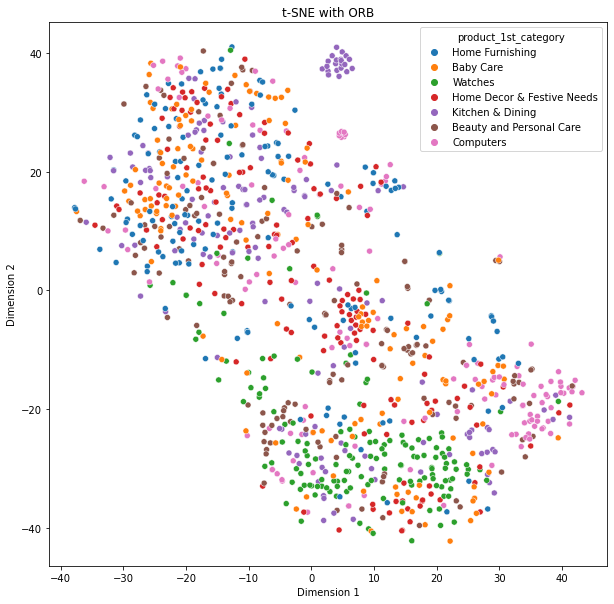

In [137]:
# %%flake8

# use function tsne_display to reduce dimension and display tsne for ORB
tsne_orb = tsne_display(X_pca_orb, 't-SNE with ORB',
                         datas['product_1st_category'])

#### Clustering

In [138]:
# %%flake8

# use function kmeans_clustering to calculate clusters
# label with countvectorizer

labels_orb = kmeans_clustering(X_pca_orb, 7, rd_state)

In [139]:
# %%flake8

# add column with ORB cluster label to the datas
datas = merge_clust_label(datas, labels_orb,
                          'KMeans_orb')

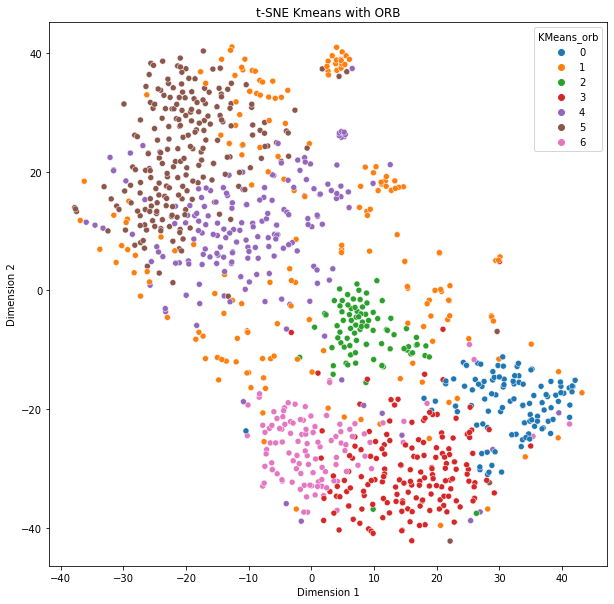

In [140]:
# %%flake8

# display tsne for countvectorizer
tsne_kmeans_orb = tsne_display(X_pca_orb,
                                't-SNE Kmeans with ORB',
                                datas['KMeans_orb'])

In [141]:
# %%flake8

# calculate and save the ARI score
score_ari_orb = adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['KMeans_orb'])
print("ARI score : ", score_ari_orb)

ARI score :  0.059942433850480224


In [142]:
# %%flake8

# store results in score_ari_result
score_ari_result = score_ari_result.append(
    {'Feature type': 'Image',
     'Features extractor': 'ORB',
     'ARI score': score_ari_orb}, ignore_index=True)

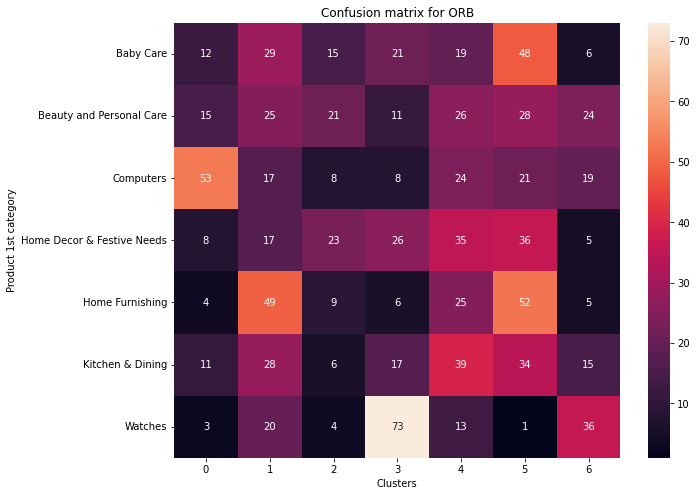

In [143]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_orb,
                 'Confusion matrix for ORB')

### CNN - Transfer Learning

#### VGG-16

In [144]:
# %%flake8

# load model VGG-16 without classifier layers and add a pooling layer
model_vgg16 = VGG16(weights='imagenet', include_top=False,
              pooling='max', input_shape=(224, 224, 3))
model_vgg16.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

##### Normalization of images

In [145]:
# %%flake8

def normalize_image_cnn(image, size=224):
    """ create a function to normalize image, open it,
    resize and equalize historgram"""
    
    # open image
    img = cv2.imread('Flipkart/Images/' + image)

    # convert image in RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # resize image
    img_resized = image_resize(img_rgb, size=size)

    return img_resized

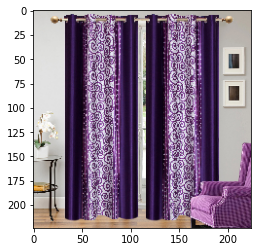

In [146]:
# %%flake8

# normalize an image
img_test = normalize_image_cnn(datas['image'].iloc[0])
plt.imshow(img_test)
plt.show()

##### Features extraction

In [147]:
# %%flake8

def cnn_features(image, model, cnn):
    """ create function to extract the image features with a model """

    # reshape image data for the model
    img_data = np.expand_dims(image, axis=0)

    # prepare the image data for the the model requires
    img_data = cnn.preprocess_input(img_data)

    # get the features extracted
    features_img = model.predict(img_data)

    return features_img

In [148]:
# %%flake8

# extract features with VGG-16 for one image
cnn_features(img_test, model_vgg16, vgg16)

array([[0.00000000e+00, 9.52501011e+00, 1.50660009e+01, 0.00000000e+00,
        2.82528229e+01, 0.00000000e+00, 6.96347046e+01, 2.28209686e+00,
        0.00000000e+00, 1.51765566e+01, 0.00000000e+00, 5.99223995e+00,
        2.89040585e+01, 0.00000000e+00, 2.52716141e+01, 4.15233803e+01,
        9.19097233e+00, 2.64269409e+01, 1.83745689e+01, 2.69991627e+01,
        3.21468430e+01, 0.00000000e+00, 3.48889465e+01, 4.19264336e+01,
        0.00000000e+00, 2.90467434e+01, 3.54095101e+00, 1.10092232e+02,
        2.62283554e+01, 4.75474405e+00, 9.21414032e+01, 0.00000000e+00,
        2.28652439e+01, 2.42756634e+01, 1.08210632e+02, 1.67760639e+01,
        2.24104042e+01, 1.21105759e+02, 3.24154358e+01, 0.00000000e+00,
        2.53603020e+01, 0.00000000e+00, 4.51470032e+01, 5.04565811e+01,
        3.17517376e+00, 1.65454407e+01, 2.98871078e+01, 1.29742661e+02,
        2.10714054e+01, 0.00000000e+00, 2.15407047e+01, 4.73384361e+01,
        5.27866631e+01, 2.95855484e+01, 0.00000000e+00, 5.058523

In [149]:
# %%flake8

# use function vgg16_features to add descriptors to all images with VGG-16
datas['image_descriptors_vgg16'] = datas['image'].apply(
    normalize_image_cnn).apply(cnn_features, model = model_vgg16, cnn = vgg16)

In [150]:
datas

uniq_id           crawl_timestamp  \
0     55b85ea15a1536d46b7190ad6fff8ce7 2016-04-30 03:22:56+00:00   
1     7b72c92c2f6c40268628ec5f14c6d590 2016-04-30 03:22:56+00:00   
2     64d5d4a258243731dc7bbb1eef49ad74 2016-04-30 03:22:56+00:00   
3     d4684dcdc759dd9cdf41504698d737d8 2016-06-20 08:49:52+00:00   
4     6325b6870c54cd47be6ebfbffa620ec7 2016-06-20 08:49:52+00:00   
...                                ...                       ...   
1045  958f54f4c46b53c8a0a9b8167d9140bc 2015-12-01 10:15:43+00:00   
1046  fd6cbcc22efb6b761bd564c28928483c 2015-12-01 10:15:43+00:00   
1047  5912e037d12774bb73a2048f35a00009 2015-12-01 10:15:43+00:00   
1048  c3edc504d1b4f0ba6224fa53a43a7ad6 2015-12-01 10:15:43+00:00   
1049  f2f027ad6a6df617c9f125173da71e44 2015-12-01 10:15:43+00:00   

                                                                                                                          product_url  \
0          http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z   
1                                          http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH   
2                                 http://www.flipkart.com/eurospa-cotton-terry-face-towel-set/p/itmeg6shbrpubhca?pid=BTWEG6SHXTDB2A2Y   
3     http://www.flipkart.com/santosh-royal-fashion-cotton-printed-king-sized-double-bedsheet/p/itmejt9uaqahahuf?pid=BDSEJT9UQWHDUBH4   
4               http://www.flipkart.com/jaipur-print-cotton-floral-king-sized-double-bedsheet/p/itmejthnwahrnt7v?pid=BDSEJTHNGWVGWWQU   
...                                                                                                                               ...   
1045                   http://www.flipkart.com/oren-empower-extra-large-self-adhesive-sticker/p/itme88zgzgcvtbpx?pid=STIE88ZGTX65GH4V   
1046                                   http://www.flipkart.com/wallmantra-large-vinyl-sticker/p/itmec889fxheshyg?pid=STIEC889ZD5GDCVQ   
1047  http://www.flipkart.com/uberlyfe-extra-large-pigmented-polyvinyl-films-imported-sticker/p/itme5uvggyhfrd4p?pid=STIE5UVGW2JWVWCT   
1048                                  http://www.flipkart.com/wallmantra-medium-vinyl-sticker/p/itmec889gxdsfhzb?pid=STIEC889ZGFD3RCE   
1049                                     http://www.flipkart.com/uberlyfe-large-vinyl-sticker/p/itme2zepqqzr9jt5?pid=STIE2ZEPACRQJKH7   

                                                           product_name  \
0            Elegance Polyester Multicolor Abstract Eyelet Door Curtain   
1                                            Sathiyas Cotton Bath Towel   
2                                   Eurospa Cotton Terry Face Towel Set   
3       SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet   
4                 Jaipur Print Cotton Floral King sized Double Bedsheet   
...                                                                 ...   
1045                     Oren Empower Extra Large Self Adhesive Sticker   
1046                             Wallmantra Large Vinyl Sticker Sticker   
1047  Uberlyfe Extra Large Pigmented Polyvinyl Films (Imported) Sticker   
1048                            Wallmantra Medium Vinyl Sticker Sticker   
1049                                       Uberlyfe Large Vinyl Sticker   

                                                                                                                          product_category_tree  \
0                              ["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]   
1     ["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]   
2      ["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]   
3       ["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bed

In [151]:
# %%flake8

# concatenate the features image in VGG-16 features
vgg16_feature_list = np.concatenate(datas['image_descriptors_vgg16'])

##### Dimension reduction

In [152]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_vgg16, X_pca_vgg16, Xscaled_vgg16 = calculate_pca(
    vgg16_feature_list, normalization=Normalizer(), nb_components=0.99)

print("Dimensions dataset before PCA reduction : ", vgg16_feature_list.shape)
print("Dimensions dataset after PCA reduction : ", X_pca_vgg16.shape)

Dimensions dataset before PCA reduction :  (1050, 512)
Dimensions dataset after PCA reduction :  (1050, 404)


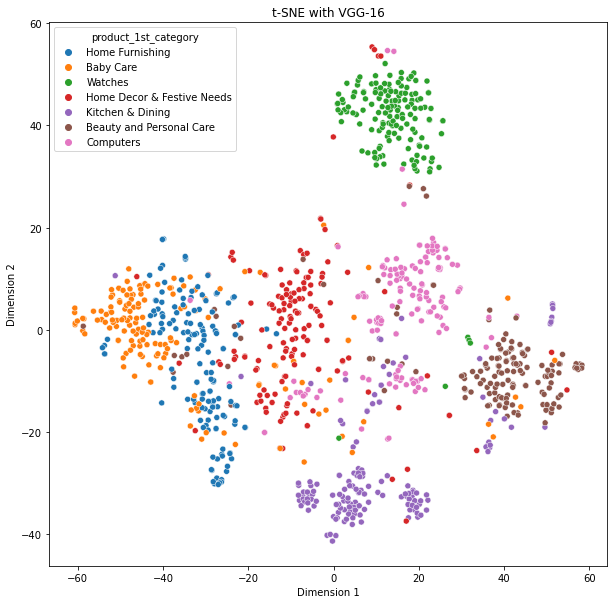

In [153]:
# %%flake8

# use function tsne_display to reduce dimension and display tsne for VGG-16
tsne_vgg16 = tsne_display(X_pca_vgg16, 't-SNE with VGG-16',
                         datas['product_1st_category'])

##### Clustering

In [154]:
# %%flake8

# use function kmeans_clustering to calculate clusters
# label with VGG-16

labels_vgg16 = kmeans_clustering(X_pca_vgg16, 7, rd_state)

In [155]:
# %%flake8

# add column with VGG-16 cluster label to the datas
datas = merge_clust_label(datas, labels_vgg16,
                          'KMeans_vgg16')

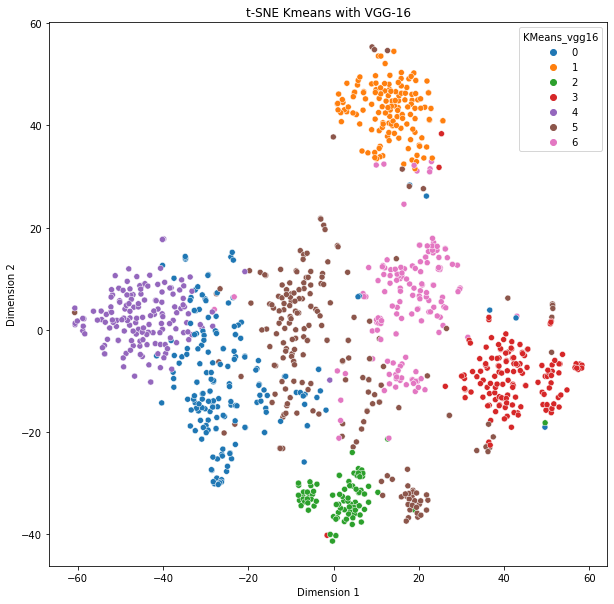

In [156]:
# %%flake8

# display tsne for VGG-16
tsne_kmeans_vgg16 = tsne_display(X_pca_vgg16,
                                't-SNE Kmeans with VGG-16',
                                datas['KMeans_vgg16'])

In [157]:
# %%flake8

# calculate and save the ARI score
score_ari_vgg16 = adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['KMeans_vgg16'])
print("ARI score : ", score_ari_vgg16)

ARI score :  0.5042099570000778


In [158]:
# %%flake8

# store results in score_ari_result
score_ari_result = score_ari_result.append(
    {'Feature type': 'Image',
     'Features extractor': 'VGG-16',
     'ARI score': score_ari_vgg16}, ignore_index=True)

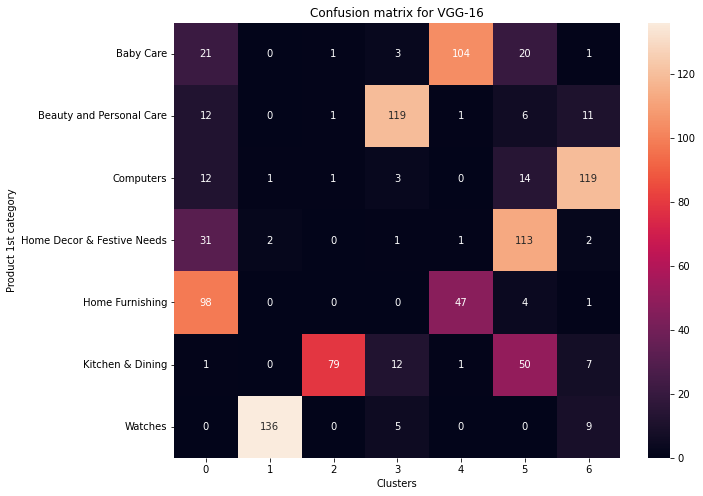

In [159]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_vgg16,
                 'Confusion matrix for VGG-16')

#### ResNet50

In [160]:
# %%flake8

# load model ResNet50 without classifier layers and add a pooling layer
model_resnet50 = ResNet50(weights='imagenet', include_top=False,
              pooling='max', input_shape=(224, 224, 3))
model_resnet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

##### Normalization of images

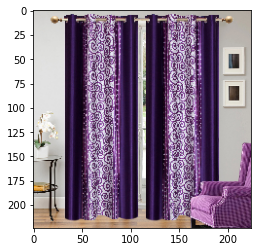

In [161]:
# %%flake8

# normalize an image
img_test = normalize_image_cnn(datas['image'].iloc[0])
plt.imshow(img_test)
plt.show()

##### Features extraction

In [162]:
# %%flake8

# extract features with ResNet50 for one image
cnn_features( img_test, model_resnet50, resnet50)

array([[6.917305 , 3.5019841, 3.8193612, ..., 2.6421762, 2.3358064,
        7.847828 ]], dtype=float32)

In [163]:
# %%flake8

# use function cnn_features to add descriptors to all images with ResNet50
datas['image_descriptors_resnet50'] = datas['image'].apply(
    normalize_image_cnn).apply(cnn_features, model = model_resnet50, cnn = resnet50)

In [164]:
datas

uniq_id           crawl_timestamp  \
0     55b85ea15a1536d46b7190ad6fff8ce7 2016-04-30 03:22:56+00:00   
1     7b72c92c2f6c40268628ec5f14c6d590 2016-04-30 03:22:56+00:00   
2     64d5d4a258243731dc7bbb1eef49ad74 2016-04-30 03:22:56+00:00   
3     d4684dcdc759dd9cdf41504698d737d8 2016-06-20 08:49:52+00:00   
4     6325b6870c54cd47be6ebfbffa620ec7 2016-06-20 08:49:52+00:00   
...                                ...                       ...   
1045  958f54f4c46b53c8a0a9b8167d9140bc 2015-12-01 10:15:43+00:00   
1046  fd6cbcc22efb6b761bd564c28928483c 2015-12-01 10:15:43+00:00   
1047  5912e037d12774bb73a2048f35a00009 2015-12-01 10:15:43+00:00   
1048  c3edc504d1b4f0ba6224fa53a43a7ad6 2015-12-01 10:15:43+00:00   
1049  f2f027ad6a6df617c9f125173da71e44 2015-12-01 10:15:43+00:00   

                                                                                                                          product_url  \
0          http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z   
1                                          http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH   
2                                 http://www.flipkart.com/eurospa-cotton-terry-face-towel-set/p/itmeg6shbrpubhca?pid=BTWEG6SHXTDB2A2Y   
3     http://www.flipkart.com/santosh-royal-fashion-cotton-printed-king-sized-double-bedsheet/p/itmejt9uaqahahuf?pid=BDSEJT9UQWHDUBH4   
4               http://www.flipkart.com/jaipur-print-cotton-floral-king-sized-double-bedsheet/p/itmejthnwahrnt7v?pid=BDSEJTHNGWVGWWQU   
...                                                                                                                               ...   
1045                   http://www.flipkart.com/oren-empower-extra-large-self-adhesive-sticker/p/itme88zgzgcvtbpx?pid=STIE88ZGTX65GH4V   
1046                                   http://www.flipkart.com/wallmantra-large-vinyl-sticker/p/itmec889fxheshyg?pid=STIEC889ZD5GDCVQ   
1047  http://www.flipkart.com/uberlyfe-extra-large-pigmented-polyvinyl-films-imported-sticker/p/itme5uvggyhfrd4p?pid=STIE5UVGW2JWVWCT   
1048                                  http://www.flipkart.com/wallmantra-medium-vinyl-sticker/p/itmec889gxdsfhzb?pid=STIEC889ZGFD3RCE   
1049                                     http://www.flipkart.com/uberlyfe-large-vinyl-sticker/p/itme2zepqqzr9jt5?pid=STIE2ZEPACRQJKH7   

                                                           product_name  \
0            Elegance Polyester Multicolor Abstract Eyelet Door Curtain   
1                                            Sathiyas Cotton Bath Towel   
2                                   Eurospa Cotton Terry Face Towel Set   
3       SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet   
4                 Jaipur Print Cotton Floral King sized Double Bedsheet   
...                                                                 ...   
1045                     Oren Empower Extra Large Self Adhesive Sticker   
1046                             Wallmantra Large Vinyl Sticker Sticker   
1047  Uberlyfe Extra Large Pigmented Polyvinyl Films (Imported) Sticker   
1048                            Wallmantra Medium Vinyl Sticker Sticker   
1049                                       Uberlyfe Large Vinyl Sticker   

                                                                                                                          product_category_tree  \
0                              ["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]   
1     ["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]   
2      ["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]   
3       ["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bed

In [165]:
# %%flake8

# concatenate the features image in ResNet50 features
resnet50_feature_list = np.concatenate(datas['image_descriptors_resnet50'])

##### Dimension reduction

In [166]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_resnet50, X_pca_resnet50, X_scaled_resnet50 = calculate_pca(
    resnet50_feature_list, normalization=Normalizer(), nb_components=0.99)

print("Dimensions dataset before PCA reduction : ", resnet50_feature_list.shape)
print("Dimensions dataset after PCA reduction : ", X_pca_resnet50.shape)

Dimensions dataset before PCA reduction :  (1050, 2048)
Dimensions dataset after PCA reduction :  (1050, 809)


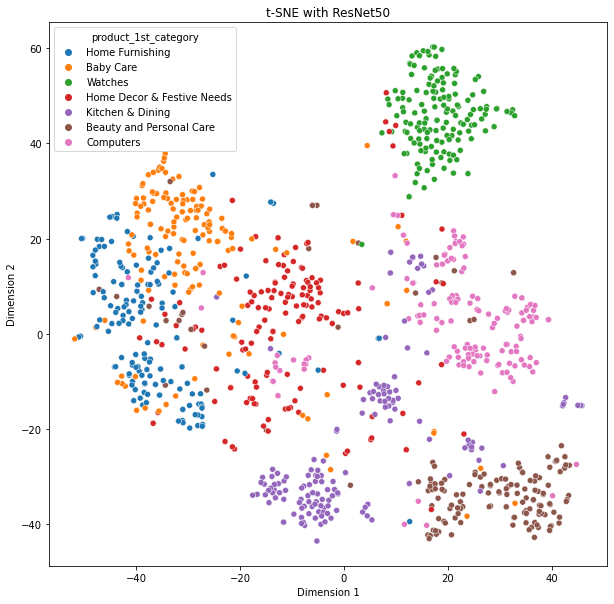

In [167]:
# %%flake8

# use function tsne_display to reduce dimension and display tsne for ResNet50
tsne_resnet50 = tsne_display(X_pca_resnet50, 't-SNE with ResNet50',
                         datas['product_1st_category'])

##### Clustering

In [168]:
# %%flake8

# use function kmeans_clustering to calculate clusters
# label with ResNet50

labels_resnet50 = kmeans_clustering(X_pca_resnet50, 7, rd_state)

In [169]:
# %%flake8

# add column with ResNet50 cluster label to the datas
datas = merge_clust_label(datas, labels_resnet50,
                          'KMeans_resnet50')

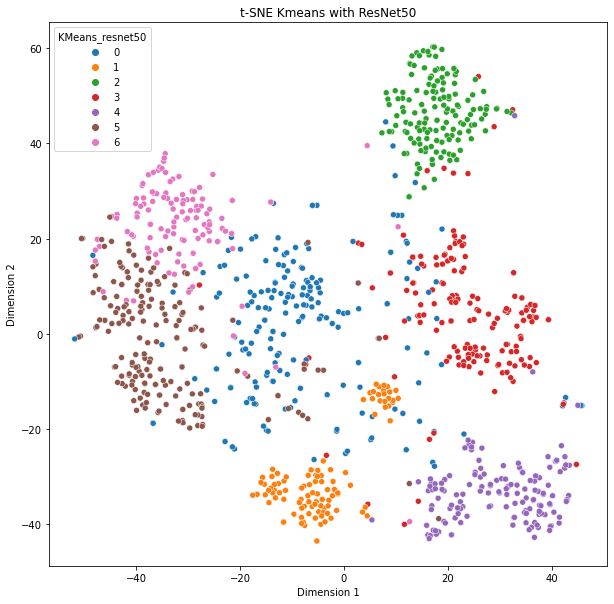

In [170]:
# %%flake8

# display tsne for ResNet50
tsne_kmeans_resnet50 = tsne_display(X_pca_resnet50,
                                't-SNE Kmeans with ResNet50',
                                datas['KMeans_resnet50'])

In [171]:
# %%flake8

# calculate and save the ARI score
score_ari_resnet50 = adjusted_rand_score(
    datas['product_1st_category_encoded'], datas['KMeans_resnet50'])
print("ARI score : ", score_ari_resnet50)

ARI score :  0.5783218901586428


In [172]:
# %%flake8

# store results in score_ari_result
score_ari_result = score_ari_result.append(
    {'Feature type': 'Image',
     'Features extractor': 'ResNet50',
     'ARI score': score_ari_resnet50}, ignore_index=True)

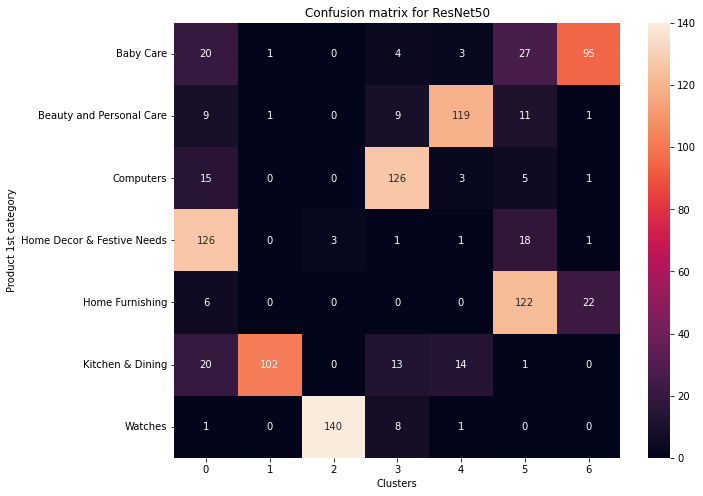

In [173]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_resnet50,
                 'Confusion matrix for ResNet50')

# Combine features extractions text and image

## Select best features extractors and merge

In [174]:
# display results of ARI score
score_ari_result

,Feature type,Features extractor,ARI score
0,Text,Countvectorizer,0.30
1,Text,tf-idf,0.28
2,Text,Universal sentence encoder,0.34
3,Image,SIFT,0.07
4,Image,ORB,0.06
5,Image,VGG-16,0.50
6,Image,ResNet50,0.58


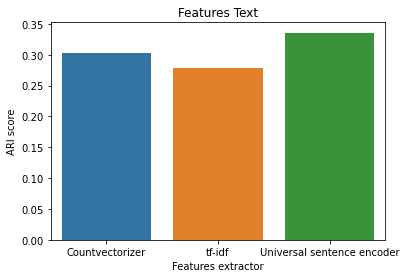

Best score for Universal sentence encoder : 0.336

--------------------------------------------------


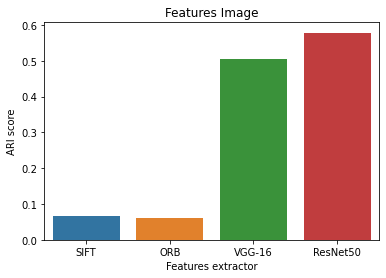

Best score for ResNet50 : 0.578

--------------------------------------------------


In [175]:
# %%flake8

# display graph with ARI score for differents features extractors
for i in score_ari_result['Feature type'].unique():
    mask = score_ari_result['Feature type'] == i
    sns.barplot(x='Features extractor', y='ARI score',
                data=score_ari_result[mask])
    plt.title('Features ' + i)
    
    # to save graph
    plt.savefig('Features ' + i + '.png', bbox_inches='tight')

    plt.show()
    max_score_idx = score_ari_result[mask]['ARI score'].idxmax()
    print("Best score for",
          score_ari_result['Features extractor'].iloc[max_score_idx],
          ": {:.3f}" .format(score_ari_result['ARI score'].iloc[max_score_idx]))
    print("\n"+"-"*50)

* Best features extractor for texts is  : Universal sentence encoder
* Best features extractor for images is  : ResNet50

In [176]:
# %%flake8

# merge descriptors from USE and ResNET50
# convert descriptors of resnet50 in a list
datas["merged_descriptors_use_and_resnet50"] = \
    datas['text_descriptors_use'] + \
    datas['image_descriptors_resnet50'].apply(
    np.squeeze).apply(lambda x: x.tolist())

In [177]:
datas

uniq_id           crawl_timestamp  \
0     55b85ea15a1536d46b7190ad6fff8ce7 2016-04-30 03:22:56+00:00   
1     7b72c92c2f6c40268628ec5f14c6d590 2016-04-30 03:22:56+00:00   
2     64d5d4a258243731dc7bbb1eef49ad74 2016-04-30 03:22:56+00:00   
3     d4684dcdc759dd9cdf41504698d737d8 2016-06-20 08:49:52+00:00   
4     6325b6870c54cd47be6ebfbffa620ec7 2016-06-20 08:49:52+00:00   
...                                ...                       ...   
1045  958f54f4c46b53c8a0a9b8167d9140bc 2015-12-01 10:15:43+00:00   
1046  fd6cbcc22efb6b761bd564c28928483c 2015-12-01 10:15:43+00:00   
1047  5912e037d12774bb73a2048f35a00009 2015-12-01 10:15:43+00:00   
1048  c3edc504d1b4f0ba6224fa53a43a7ad6 2015-12-01 10:15:43+00:00   
1049  f2f027ad6a6df617c9f125173da71e44 2015-12-01 10:15:43+00:00   

                                                                                                                          product_url  \
0          http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z   
1                                          http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH   
2                                 http://www.flipkart.com/eurospa-cotton-terry-face-towel-set/p/itmeg6shbrpubhca?pid=BTWEG6SHXTDB2A2Y   
3     http://www.flipkart.com/santosh-royal-fashion-cotton-printed-king-sized-double-bedsheet/p/itmejt9uaqahahuf?pid=BDSEJT9UQWHDUBH4   
4               http://www.flipkart.com/jaipur-print-cotton-floral-king-sized-double-bedsheet/p/itmejthnwahrnt7v?pid=BDSEJTHNGWVGWWQU   
...                                                                                                                               ...   
1045                   http://www.flipkart.com/oren-empower-extra-large-self-adhesive-sticker/p/itme88zgzgcvtbpx?pid=STIE88ZGTX65GH4V   
1046                                   http://www.flipkart.com/wallmantra-large-vinyl-sticker/p/itmec889fxheshyg?pid=STIEC889ZD5GDCVQ   
1047  http://www.flipkart.com/uberlyfe-extra-large-pigmented-polyvinyl-films-imported-sticker/p/itme5uvggyhfrd4p?pid=STIE5UVGW2JWVWCT   
1048                                  http://www.flipkart.com/wallmantra-medium-vinyl-sticker/p/itmec889gxdsfhzb?pid=STIEC889ZGFD3RCE   
1049                                     http://www.flipkart.com/uberlyfe-large-vinyl-sticker/p/itme2zepqqzr9jt5?pid=STIE2ZEPACRQJKH7   

                                                           product_name  \
0            Elegance Polyester Multicolor Abstract Eyelet Door Curtain   
1                                            Sathiyas Cotton Bath Towel   
2                                   Eurospa Cotton Terry Face Towel Set   
3       SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet   
4                 Jaipur Print Cotton Floral King sized Double Bedsheet   
...                                                                 ...   
1045                     Oren Empower Extra Large Self Adhesive Sticker   
1046                             Wallmantra Large Vinyl Sticker Sticker   
1047  Uberlyfe Extra Large Pigmented Polyvinyl Films (Imported) Sticker   
1048                            Wallmantra Medium Vinyl Sticker Sticker   
1049                                       Uberlyfe Large Vinyl Sticker   

                                                                                                                          product_category_tree  \
0                              ["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]   
1     ["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]   
2      ["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]   
3       ["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bed

In [178]:
# %%flake8

# concatenate the features for merged_descriptors_use_and_resnet50
merged_descriptors_use_and_resnet50_feature_list = np.asarray(
    datas['merged_descriptors_use_and_resnet50'].tolist())

## Dimension reduction

In [179]:
# %%flake8

# use function calculate_pca to reduce dimension and keep 99% of variance
pca_merged, X_pca_merged, X_scaled_merged = calculate_pca(
    merged_descriptors_use_and_resnet50_feature_list, nb_components=0.99)

print("Dimensions dataset before PCA reduction : ",
      merged_descriptors_use_and_resnet50_feature_list.shape)
print("Dimensions dataset after PCA reduction : ", X_pca_merged.shape)

Dimensions dataset before PCA reduction :  (1050, 2560)
Dimensions dataset after PCA reduction :  (1050, 855)


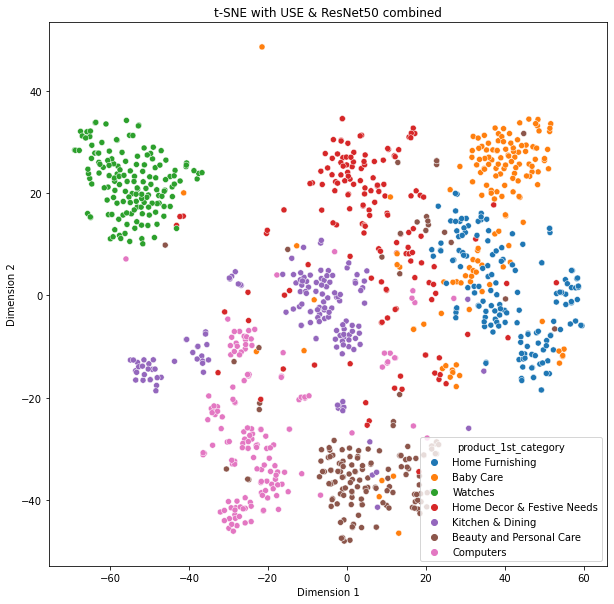

In [180]:
# %%flake8

# use function tsne_display to reduce dimension and display tsne for 
#
tsne_merged = tsne_display(X_pca_merged, 't-SNE with USE & ResNet50 combined',
                         datas['product_1st_category'])

## Clustering

In [181]:
# %%flake8

# use function kmeans_clustering to calculate clusters
# label with countvectorizer

labels_merged = kmeans_clustering(X_pca_merged, 7, rd_state)

In [182]:
# %%flake8

# add column with merged_descriptors_use_and_resnet50 cluster label to the datas
datas = merge_clust_label(datas, labels_merged,
                          'KMeans_merged_descriptors_use_and_resnet50')

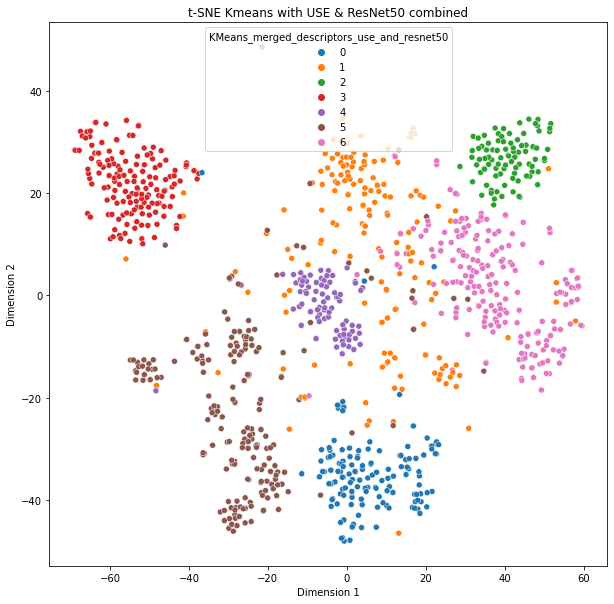

In [183]:
# %%flake8

# display tsne for countvectorizer
tsne_kmeans_merged = tsne_display(X_pca_merged,
                                't-SNE Kmeans with USE & ResNet50 combined',
                                datas['KMeans_merged_descriptors_use_and_resnet50'])

In [184]:
# %%flake8

# calculate and save the ARI score
score_ari_merged = adjusted_rand_score(
    datas['product_1st_category_encoded'],
    datas['KMeans_merged_descriptors_use_and_resnet50'])
print("ARI score : ", score_ari_merged)

ARI score :  0.608705992002035


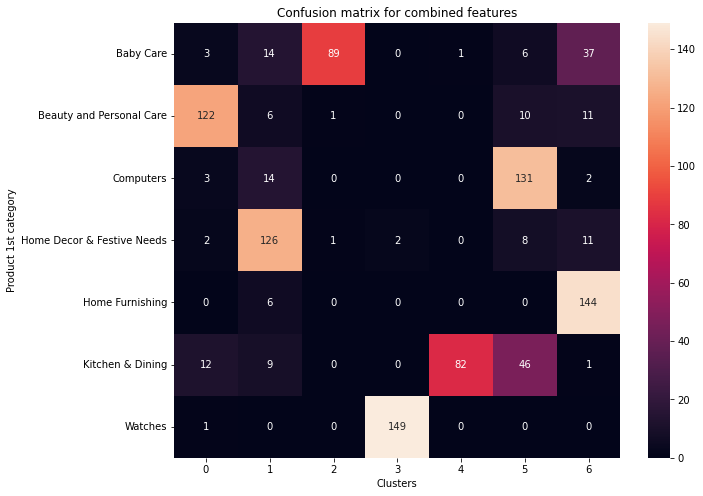

In [185]:
# %%flake8

# use function confusion_matrix
confusion_matrix(datas['product_1st_category'], labels_merged,
                 'Confusion matrix for combined features')